Comparison summary:


,metric,baseline_mean,baseline_median,baseline_p95,baseline_p975,observed_mean,observed_median,observed_p05,observed_p95,exceed_rate_p95,exceed_rate_p975,ratio_observed_median_to_baseline_p95,overlap,separation,ratio_capped,ratio_score,exceed_score,separation_score,integrated_score,interpretation
0,raw_late_slope,0.053692,0.044980,0.134506,0.153697,0.673607,0.674265,0.658830,0.685596,1.000,1.000,5.012883,2.274913e-235,1.000000,5.000000,1.000000,1.000,1.000000,1.000000,Strong
1,standardized_late_slope,0.063993,0.054326,0.159892,0.184362,0.799656,0.799134,0.744522,0.853695,1.000,1.000,4.997970,9.405208e-92,1.000000,4.997970,0.999594,1.000,1.000000,0.999865,Strong
2,pearson_r,0.012377,0.010389,0.030255,0.033641,0.123609,0.123301,0.106507,0.140655,1.000,1.000,4.075394,8.588001e-25,1.000000,4.075394,0.815079,1.000,1.000000,0.938360,Strong
3,distance_correlation,0.011944,0.009795,0.029302,0.034922,0.090141,0.089449,0.074854,0.107806,1.000,1.000,3.052603,1.791418e-04,0.999821,3.052603,0.610521,1.000,0.999821,0.870114,Strong
4,raw_early_slope,0.149055,0.124551,0.380074,0.426833,0.938345,0.938639,0.730953,1.146750,1.000,1.000,2.469620,4.499593e-03,0.995500,2.469620,0.493924,1.000,0.995500,0.829808,Strong
5,standardized_early_slope,0.183601,0.154871,0.465569,0.553386,1.128792,1.122054,0.880616,1.379911,1.000,1.000,2.410073,4.336460e-03,0.995664,2.410073,0.482015,1.000,0.995664,0.825893,Strong
6,raw_overall_slope,0.035449,0.029914,0.090251,0.105810,0.181505,0.180538,0.132912,0.231781,0.998,0.990,2.000407,3.426949e-02,0.965731,2.000407,0.400081,0.998,0.965731,0.787937,Strong
7,raw_middle_slope,0.079559,0.067154,0.194428,0.216818,0.374168,0.378306,0.277496,0.457780,1.000,0.995,1.945733,3.225921e-02,0.967741,1.945733,0.389147,1.000,0.967741,0.785629,Strong
8,standardized_middle_slope,0.098423,0.085486,0.239178,0.270242,0.441496,0.446888,0.315069,0.549949,0.995,0.986,1.868434,4.517455e-02,0.954825,1.868434,0.373687,0.995,0.954825,0.774504,Strong
9,standardized_overall_slope,0.046438,0.039539,0.115626,0.130560,0.211040,0.211537,0.138182,0.283285,0.982,0.964,1.829495,6.680693e-02,0.933193,1.829495,0.365899,0.982,0.933193,0.760364,Strong


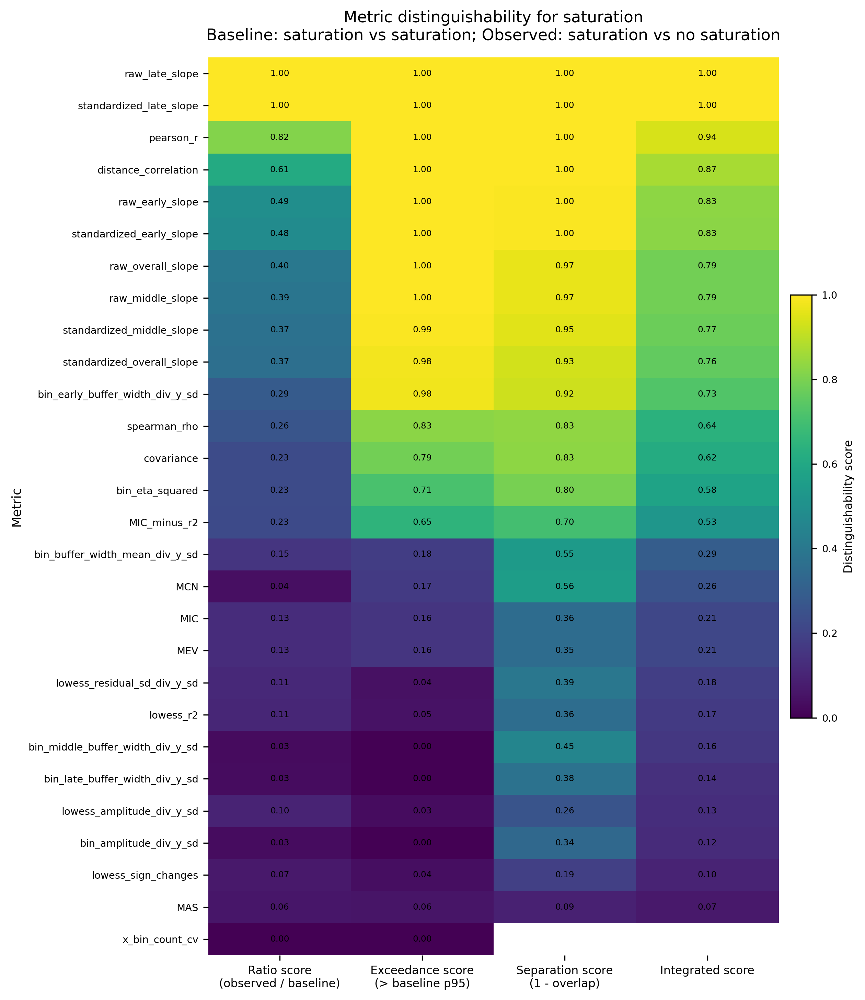

baseline_diff_df shape: (1000, 29)
observed_diff_df shape: (1000, 29)
comparison_distribution_df shape: (28, 20)


In [11]:
# ==========================================================
# Saturation test experiment
# Baseline: Saturation vs Saturation
# Observed: Saturation vs No saturation
# Final output: one integrated summary figure
# ==========================================================

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from scipy.stats import pearsonr, spearmanr, gaussian_kde
from scipy.spatial.distance import pdist, squareform
from statsmodels.nonparametric.smoothers_lowess import lowess


# ==========================================================
# Optional: MIC / MAS / MEV / MCN
# ==========================================================

try:
    from minepy import MINE
    HAS_MINEPY = True
except Exception:
    HAS_MINEPY = False
    print("minepy is not installed. MIC/MAS/MEV/MCN will be skipped.")


# ==========================================================
# 1. Generate saturation / no-saturation data
# ==========================================================

def generate_saturation_data(
    seed,
    n=180,
    saturation=True,
    noise_sd=0.035,
    x_random=True,
):
    rng = np.random.default_rng(seed)

    if x_random:
        x = np.sort(rng.uniform(0, 1, n))
    else:
        x = np.linspace(0, 1, n)

    if saturation:
        # Saturation: early dynamic response, late plateau
        y_base = 0.12 + 0.76 * (1 - np.exp(-4.5 * x))
    else:
        # No saturation: approximately linear response
        y_base = 0.12 + 0.76 * x

    y = y_base + rng.normal(0, noise_sd, n)

    # Do not clip y, because clipping may artificially strengthen plateau
    return x, y


# ==========================================================
# 2. Basic metric helpers
# ==========================================================

def safe_pearson(x, y):
    x = np.asarray(x, dtype=float)
    y = np.asarray(y, dtype=float)

    valid = np.isfinite(x) & np.isfinite(y)
    x = x[valid]
    y = y[valid]

    if len(x) < 3 or np.nanstd(x) == 0 or np.nanstd(y) == 0:
        return np.nan

    return pearsonr(x, y)[0]


def safe_spearman(x, y):
    x = np.asarray(x, dtype=float)
    y = np.asarray(y, dtype=float)

    valid = np.isfinite(x) & np.isfinite(y)
    x = x[valid]
    y = y[valid]

    if len(x) < 3 or np.nanstd(x) == 0 or np.nanstd(y) == 0:
        return np.nan

    return spearmanr(x, y)[0]


def safe_covariance(x, y):
    x = np.asarray(x, dtype=float)
    y = np.asarray(y, dtype=float)

    valid = np.isfinite(x) & np.isfinite(y)
    x = x[valid]
    y = y[valid]

    if len(x) < 3 or np.nanstd(x) == 0 or np.nanstd(y) == 0:
        return np.nan

    return np.cov(x, y, ddof=1)[0, 1]


def distance_correlation(x, y):
    x = np.asarray(x, dtype=float).reshape(-1, 1)
    y = np.asarray(y, dtype=float).reshape(-1, 1)

    valid = np.isfinite(x[:, 0]) & np.isfinite(y[:, 0])
    x = x[valid]
    y = y[valid]

    if len(x) < 3:
        return np.nan

    a = squareform(pdist(x, metric="euclidean"))
    b = squareform(pdist(y, metric="euclidean"))

    A = a - a.mean(axis=0)[None, :] - a.mean(axis=1)[:, None] + a.mean()
    B = b - b.mean(axis=0)[None, :] - b.mean(axis=1)[:, None] + b.mean()

    dcov2_xy = np.mean(A * B)
    dcov2_xx = np.mean(A * A)
    dcov2_yy = np.mean(B * B)

    if dcov2_xx <= 0 or dcov2_yy <= 0:
        return np.nan

    return np.sqrt(dcov2_xy / np.sqrt(dcov2_xx * dcov2_yy))


def compute_mine_metrics(x, y):
    empty = {
        "MIC": np.nan,
        "MAS": np.nan,
        "MEV": np.nan,
        "MCN": np.nan,
        "MIC_minus_r2": np.nan,
    }

    if not HAS_MINEPY:
        return empty

    x = np.asarray(x, dtype=float)
    y = np.asarray(y, dtype=float)

    valid = np.isfinite(x) & np.isfinite(y)
    x = x[valid]
    y = y[valid]

    if len(x) < 5:
        return empty

    mine = MINE(alpha=0.6, c=15)
    mine.compute_score(x, y)

    mic = mine.mic()
    mas = mine.mas()
    mev = mine.mev()
    mcn = mine.mcn()

    r = safe_pearson(x, y)
    r2 = r ** 2 if np.isfinite(r) else np.nan

    return {
        "MIC": mic,
        "MAS": mas,
        "MEV": mev,
        "MCN": mcn,
        "MIC_minus_r2": mic - r2 if np.isfinite(r2) else np.nan,
    }


def minmax01(v):
    v = np.asarray(v, dtype=float)

    v_min = np.nanmin(v)
    v_max = np.nanmax(v)

    if not np.isfinite(v_min) or not np.isfinite(v_max):
        return np.full_like(v, np.nan)

    if v_max == v_min:
        return np.full_like(v, np.nan)

    return (v - v_min) / (v_max - v_min)


def segment_slope_fit(x_seg, y_seg):
    x_seg = np.asarray(x_seg, dtype=float)
    y_seg = np.asarray(y_seg, dtype=float)

    valid = np.isfinite(x_seg) & np.isfinite(y_seg)
    x_seg = x_seg[valid]
    y_seg = y_seg[valid]

    if len(x_seg) < 3 or np.nanstd(x_seg) == 0:
        return np.nan

    return np.polyfit(x_seg, y_seg, 1)[0]


def compute_segment_slopes(x, y, standardized=False):
    x = np.asarray(x, dtype=float)
    y = np.asarray(y, dtype=float)

    valid = np.isfinite(x) & np.isfinite(y)
    x = x[valid]
    y = y[valid]

    if len(x) < 6:
        return np.nan, np.nan, np.nan, np.nan

    order = np.argsort(x)
    x = x[order]
    y = y[order]

    if standardized:
        x = minmax01(x)
        y = minmax01(y)

    if np.all(~np.isfinite(x)) or np.all(~np.isfinite(y)):
        return np.nan, np.nan, np.nan, np.nan

    n = len(x)
    i1 = n // 3
    i2 = 2 * n // 3

    overall = segment_slope_fit(x, y)
    early = segment_slope_fit(x[:i1], y[:i1])
    middle = segment_slope_fit(x[i1:i2], y[i1:i2])
    late = segment_slope_fit(x[i2:], y[i2:])

    return overall, early, middle, late


def compute_x_bin_count_cv(x, n_bins=10):
    x = np.asarray(x, dtype=float)
    x = x[np.isfinite(x)]

    if len(x) == 0:
        return np.nan

    bins = pd.cut(
        x,
        bins=n_bins,
        labels=False,
        include_lowest=True,
        duplicates="drop",
    )

    counts = pd.Series(bins).value_counts().sort_index()
    counts = counts.reindex(np.arange(n_bins), fill_value=0)

    mean_count = counts.mean()
    sd_count = counts.std(ddof=1)

    if mean_count == 0:
        return np.nan

    return sd_count / mean_count


# ==========================================================
# 3. Bin-based metrics
# ==========================================================

def compute_bin_metrics(x, y, n_bins=10, min_count_per_bin=3):
    x = np.asarray(x, dtype=float)
    y = np.asarray(y, dtype=float)

    valid = np.isfinite(x) & np.isfinite(y)
    x = x[valid]
    y = y[valid]

    empty_result = {
        "bin_amplitude_div_y_sd": np.nan,
        "bin_eta_squared": np.nan,
        "bin_buffer_width_mean_div_y_sd": np.nan,
        "bin_early_buffer_width_div_y_sd": np.nan,
        "bin_middle_buffer_width_div_y_sd": np.nan,
        "bin_late_buffer_width_div_y_sd": np.nan,
    }

    if len(x) < n_bins:
        return empty_result

    y_sd = np.nanstd(y, ddof=1)

    bins = pd.cut(
        x,
        bins=n_bins,
        labels=False,
        include_lowest=True,
        duplicates="drop",
    )

    df = pd.DataFrame({
        "x": x,
        "y": y,
        "bin": bins,
    }).dropna()

    if df.empty:
        return empty_result

    bin_stats = []

    for bin_id, g in df.groupby("bin", observed=True):

        if len(g) < min_count_per_bin:
            continue

        y_min = g["y"].min()
        y_max = g["y"].max()

        bin_stats.append({
            "bin": bin_id,
            "x_mean": g["x"].mean(),
            "y_mean": g["y"].mean(),
            "y_min": y_min,
            "y_max": y_max,
            "buffer_width": y_max - y_min,
            "count": len(g),
        })

    if len(bin_stats) < 3:
        return empty_result

    bin_df = (
        pd.DataFrame(bin_stats)
        .sort_values("x_mean")
        .reset_index(drop=True)
    )

    amplitude = bin_df["y_mean"].max() - bin_df["y_mean"].min()

    if y_sd == 0 or not np.isfinite(y_sd):
        amplitude_div_y_sd = np.nan
        bin_df["buffer_width_div_y_sd"] = np.nan
    else:
        amplitude_div_y_sd = amplitude / y_sd
        bin_df["buffer_width_div_y_sd"] = bin_df["buffer_width"] / y_sd

    y_global_mean = df["y"].mean()
    ss_total = np.sum((df["y"] - y_global_mean) ** 2)

    ss_between = 0.0

    for _, g in df.groupby("bin", observed=True):
        if len(g) < min_count_per_bin:
            continue

        y_bin_mean = g["y"].mean()
        ss_between += len(g) * (y_bin_mean - y_global_mean) ** 2

    eta_squared = ss_between / ss_total if ss_total > 0 else np.nan

    n_valid_bins = len(bin_df)
    i1 = n_valid_bins // 3
    i2 = 2 * n_valid_bins // 3

    buffer_mean = bin_df["buffer_width_div_y_sd"].mean()
    buffer_early = bin_df.iloc[:i1]["buffer_width_div_y_sd"].mean()
    buffer_middle = bin_df.iloc[i1:i2]["buffer_width_div_y_sd"].mean()
    buffer_late = bin_df.iloc[i2:]["buffer_width_div_y_sd"].mean()

    return {
        "bin_amplitude_div_y_sd": amplitude_div_y_sd,
        "bin_eta_squared": eta_squared,
        "bin_buffer_width_mean_div_y_sd": buffer_mean,
        "bin_early_buffer_width_div_y_sd": buffer_early,
        "bin_middle_buffer_width_div_y_sd": buffer_middle,
        "bin_late_buffer_width_div_y_sd": buffer_late,
    }


# ==========================================================
# 4. LOWESS metrics
# ==========================================================

def compute_lowess_metrics(x, y, frac=0.25):
    x = np.asarray(x, dtype=float)
    y = np.asarray(y, dtype=float)

    valid = np.isfinite(x) & np.isfinite(y)
    x = x[valid]
    y = y[valid]

    empty_result = {
        "lowess_amplitude_div_y_sd": np.nan,
        "lowess_residual_sd_div_y_sd": np.nan,
        "lowess_r2": np.nan,
        "lowess_sign_changes": np.nan,
    }

    if len(x) < 10:
        return empty_result

    order = np.argsort(x)
    x_sorted = x[order]
    y_sorted = y[order]

    fitted = lowess(
        endog=y_sorted,
        exog=x_sorted,
        frac=frac,
        return_sorted=True,
    )

    x_fit = fitted[:, 0]
    y_fit = fitted[:, 1]

    y_pred = np.interp(x_sorted, x_fit, y_fit)

    residual = y_sorted - y_pred
    y_sd = np.nanstd(y_sorted, ddof=1)

    amplitude = np.nanmax(y_fit) - np.nanmin(y_fit)

    if y_sd == 0 or not np.isfinite(y_sd):
        amplitude_div_y_sd = np.nan
        residual_sd_div_y_sd = np.nan
    else:
        amplitude_div_y_sd = amplitude / y_sd
        residual_sd_div_y_sd = np.nanstd(residual, ddof=1) / y_sd

    ss_res = np.sum((y_sorted - y_pred) ** 2)
    ss_tot = np.sum((y_sorted - np.nanmean(y_sorted)) ** 2)

    lowess_r2 = 1 - ss_res / ss_tot if ss_tot > 0 else np.nan

    dx = np.gradient(x_fit)
    dy = np.gradient(y_fit)

    with np.errstate(divide="ignore", invalid="ignore"):
        derivative = dy / dx

    sign = np.sign(derivative)
    sign[sign == 0] = np.nan

    valid_sign = np.isfinite(sign)

    if valid_sign.sum() < 2:
        sign_changes = np.nan
    else:
        sign_valid = sign[valid_sign]
        sign_changes = np.sum(sign_valid[1:] != sign_valid[:-1])

    return {
        "lowess_amplitude_div_y_sd": amplitude_div_y_sd,
        "lowess_residual_sd_div_y_sd": residual_sd_div_y_sd,
        "lowess_r2": lowess_r2,
        "lowess_sign_changes": sign_changes,
    }


# ==========================================================
# 5. Distribution overlap
# ==========================================================

def distribution_overlap(a, b, grid_size=1000):
    """
    Overlap coefficient between two distributions.
    0 = no overlap
    1 = complete overlap
    """

    a = pd.Series(a).replace([np.inf, -np.inf], np.nan).dropna().values
    b = pd.Series(b).replace([np.inf, -np.inf], np.nan).dropna().values

    if len(a) < 5 or len(b) < 5:
        return np.nan

    if np.nanstd(a) == 0 or np.nanstd(b) == 0:
        return np.nan

    x_min = min(np.nanmin(a), np.nanmin(b))
    x_max = max(np.nanmax(a), np.nanmax(b))

    if x_max == x_min:
        return np.nan

    grid = np.linspace(x_min, x_max, grid_size)

    kde_a = gaussian_kde(a)
    kde_b = gaussian_kde(b)

    density_a = kde_a(grid)
    density_b = kde_b(grid)

    overlap_area = np.trapz(
        np.minimum(density_a, density_b),
        grid
    )

    return overlap_area


# ==========================================================
# 6. Compute all metrics
# ==========================================================

def compute_all_metrics(x, y):
    x = np.asarray(x, dtype=float)
    y = np.asarray(y, dtype=float)

    valid = np.isfinite(x) & np.isfinite(y)
    x = x[valid]
    y = y[valid]

    metrics = {}

    # Correlation-based
    metrics["pearson_r"] = safe_pearson(x, y)
    metrics["spearman_rho"] = safe_spearman(x, y)
    metrics["covariance"] = safe_covariance(x, y)

    # Distance-based
    metrics["distance_correlation"] = distance_correlation(x, y)

    # Information-based
    metrics.update(compute_mine_metrics(x, y))

    # Density
    metrics["x_bin_count_cv"] = compute_x_bin_count_cv(x, n_bins=10)

    # Raw slopes
    (
        metrics["raw_overall_slope"],
        metrics["raw_early_slope"],
        metrics["raw_middle_slope"],
        metrics["raw_late_slope"],
    ) = compute_segment_slopes(x, y, standardized=False)

    # Standardized slopes
    (
        metrics["standardized_overall_slope"],
        metrics["standardized_early_slope"],
        metrics["standardized_middle_slope"],
        metrics["standardized_late_slope"],
    ) = compute_segment_slopes(x, y, standardized=True)

    # Bin-based
    metrics.update(
        compute_bin_metrics(
            x,
            y,
            n_bins=10,
            min_count_per_bin=3,
        )
    )

    # LOWESS-based
    metrics.update(
        compute_lowess_metrics(
            x,
            y,
            frac=0.25,
        )
    )

    return metrics


# ==========================================================
# 7. Experiment settings
# ==========================================================

n_runs = 1000
noise_sd = 0.035
x_random = True


# ==========================================================
# 8. Step 1: baseline difference distribution
#    Saturation vs Saturation
# ==========================================================

baseline_diff_records = []

for seed in range(n_runs):

    x_sat_a, y_sat_a = generate_saturation_data(
        seed=seed,
        saturation=True,
        noise_sd=noise_sd,
        x_random=x_random,
    )

    x_sat_b, y_sat_b = generate_saturation_data(
        seed=seed + 10000,
        saturation=True,
        noise_sd=noise_sd,
        x_random=x_random,
    )

    metrics_a = compute_all_metrics(x_sat_a, y_sat_a)
    metrics_b = compute_all_metrics(x_sat_b, y_sat_b)

    record = {"seed": seed}

    for metric_name in metrics_a.keys():
        value_a = metrics_a.get(metric_name, np.nan)
        value_b = metrics_b.get(metric_name, np.nan)
        record[metric_name] = abs(value_a - value_b)

    baseline_diff_records.append(record)

baseline_diff_df = pd.DataFrame(baseline_diff_records)


# ==========================================================
# 9. Step 2: observed difference distribution
#    Saturation vs No saturation
# ==========================================================

observed_diff_records = []

for seed in range(n_runs):

    x_sat, y_sat = generate_saturation_data(
        seed=seed,
        saturation=True,
        noise_sd=noise_sd,
        x_random=x_random,
    )

    x_nosat, y_nosat = generate_saturation_data(
        seed=seed,
        saturation=False,
        noise_sd=noise_sd,
        x_random=x_random,
    )

    sat_metrics = compute_all_metrics(x_sat, y_sat)
    nosat_metrics = compute_all_metrics(x_nosat, y_nosat)

    record = {"seed": seed}

    for metric_name in sat_metrics.keys():
        sat_value = sat_metrics.get(metric_name, np.nan)
        nosat_value = nosat_metrics.get(metric_name, np.nan)
        record[metric_name] = abs(sat_value - nosat_value)

    observed_diff_records.append(record)

observed_diff_df = pd.DataFrame(observed_diff_records)


# ==========================================================
# 10. Summary comparison table
# ==========================================================

metric_names = [
    c for c in baseline_diff_df.columns
    if c != "seed"
]

comparison_records = []

for metric_name in metric_names:

    baseline_values = (
        baseline_diff_df[metric_name]
        .replace([np.inf, -np.inf], np.nan)
        .dropna()
    )

    observed_values = (
        observed_diff_df[metric_name]
        .replace([np.inf, -np.inf], np.nan)
        .dropna()
    )

    if len(baseline_values) == 0 or len(observed_values) == 0:
        continue

    baseline_mean = baseline_values.mean()
    baseline_median = baseline_values.median()
    baseline_p95 = baseline_values.quantile(0.95)
    baseline_p975 = baseline_values.quantile(0.975)

    observed_mean = observed_values.mean()
    observed_median = observed_values.median()
    observed_p05 = observed_values.quantile(0.05)
    observed_p95 = observed_values.quantile(0.95)

    exceed_rate_p95 = np.mean(observed_values > baseline_p95)
    exceed_rate_p975 = np.mean(observed_values > baseline_p975)

    ratio_observed_median_to_baseline_p95 = (
        observed_median / baseline_p95
        if baseline_p95 > 0
        else np.nan
    )

    overlap = distribution_overlap(
        baseline_values,
        observed_values
    )

    separation = 1 - overlap if np.isfinite(overlap) else np.nan

    comparison_records.append({
        "metric": metric_name,

        "baseline_mean": baseline_mean,
        "baseline_median": baseline_median,
        "baseline_p95": baseline_p95,
        "baseline_p975": baseline_p975,

        "observed_mean": observed_mean,
        "observed_median": observed_median,
        "observed_p05": observed_p05,
        "observed_p95": observed_p95,

        "exceed_rate_p95": exceed_rate_p95,
        "exceed_rate_p975": exceed_rate_p975,

        "ratio_observed_median_to_baseline_p95": ratio_observed_median_to_baseline_p95,

        "overlap": overlap,
        "separation": separation,
    })

comparison_distribution_df = pd.DataFrame(comparison_records)


# ==========================================================
# 11. Add interpretation score
# ==========================================================

# Cap ratio for visualization, otherwise very large ratios dominate the plot
comparison_distribution_df["ratio_capped"] = (
    comparison_distribution_df["ratio_observed_median_to_baseline_p95"]
    .clip(upper=5)
)

# Normalize ratio to 0-1 for combined visualization
comparison_distribution_df["ratio_score"] = (
    comparison_distribution_df["ratio_capped"] / 5
)

# Higher exceed_rate means better
comparison_distribution_df["exceed_score"] = comparison_distribution_df["exceed_rate_p95"]

# Lower overlap means better, so use separation
comparison_distribution_df["separation_score"] = comparison_distribution_df["separation"]

# Integrated score
comparison_distribution_df["integrated_score"] = (
    comparison_distribution_df["ratio_score"]
    + comparison_distribution_df["exceed_score"]
    + comparison_distribution_df["separation_score"]
) / 3


def classify_metric(row):
    overlap = row["overlap"]
    exceed = row["exceed_rate_p95"]
    ratio = row["ratio_observed_median_to_baseline_p95"]

    if not np.isfinite(overlap):
        return "Invalid"

    if overlap <= 0.2 and exceed >= 0.9 and ratio >= 1:
        return "Strong"
    elif overlap <= 0.5 and exceed >= 0.7:
        return "Moderate"
    elif overlap <= 0.8:
        return "Weak"
    else:
        return "Not distinguishable"


comparison_distribution_df["interpretation"] = (
    comparison_distribution_df.apply(classify_metric, axis=1)
)

comparison_distribution_df = comparison_distribution_df.sort_values(
    "integrated_score",
    ascending=False,
).reset_index(drop=True)


print("Comparison summary:")
display(comparison_distribution_df)


# ==========================================================
# 12. One integrated figure
# ==========================================================

# Select columns to show in one heatmap
heatmap_df = comparison_distribution_df[
    [
        "metric",
        "ratio_score",
        "exceed_score",
        "separation_score",
        "integrated_score",
    ]
].copy()

heatmap_df = heatmap_df.set_index("metric")

# Rename columns for figure
heatmap_df = heatmap_df.rename(columns={
    "ratio_score": "Ratio score\n(observed / baseline)",
    "exceed_score": "Exceedance score\n(> baseline p95)",
    "separation_score": "Separation score\n(1 - overlap)",
    "integrated_score": "Integrated score",
})

fig, ax = plt.subplots(
    figsize=(8.5, max(6, 0.35 * len(heatmap_df))),
    dpi=300,
)

im = ax.imshow(
    heatmap_df.values,
    aspect="auto",
    vmin=0,
    vmax=1,
)

ax.set_xticks(np.arange(heatmap_df.shape[1]))
ax.set_xticklabels(
    heatmap_df.columns,
    fontsize=8,
    rotation=0,
)

ax.set_yticks(np.arange(heatmap_df.shape[0]))
ax.set_yticklabels(
    heatmap_df.index,
    fontsize=7,
)

# Add text values
for i in range(heatmap_df.shape[0]):
    for j in range(heatmap_df.shape[1]):
        value = heatmap_df.values[i, j]
        if np.isfinite(value):
            ax.text(
                j,
                i,
                f"{value:.2f}",
                ha="center",
                va="center",
                fontsize=6,
            )

cbar = plt.colorbar(im, ax=ax, fraction=0.035, pad=0.02)
cbar.set_label(
    "Distinguishability score",
    fontsize=8,
)
cbar.ax.tick_params(labelsize=7)

ax.set_title(
    "Metric distinguishability for saturation\n"
    "Baseline: saturation vs saturation; Observed: saturation vs no saturation",
    fontsize=11,
    pad=12,
)

ax.set_xlabel("")
ax.set_ylabel("Metric", fontsize=9)

for spine in ["top", "right", "bottom", "left"]:
    ax.spines[spine].set_visible(False)

plt.tight_layout()
plt.show()


# ==========================================================
# 13. Optional: export result table
# ==========================================================

# comparison_distribution_df.to_csv(
#     "saturation_metric_comparison_summary.csv",
#     index=False
# )

print("baseline_diff_df shape:", baseline_diff_df.shape)
print("observed_diff_df shape:", observed_diff_df.shape)
print("comparison_distribution_df shape:", comparison_distribution_df.shape)

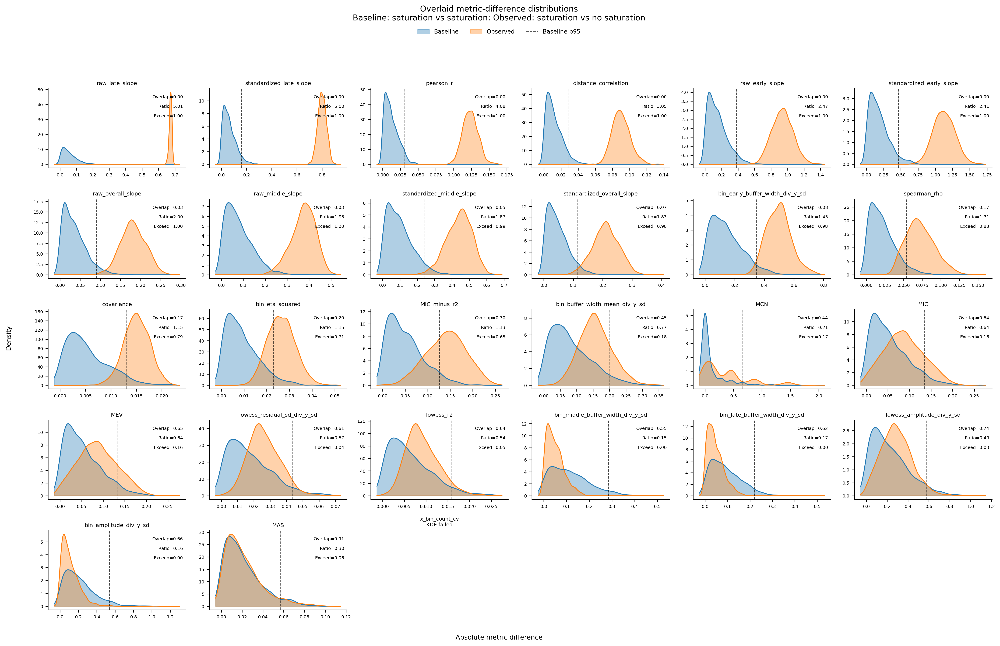

In [16]:
# ==========================================================
# Overlaid baseline vs observed distributions in one figure
# Exclude sign-related metrics
# Adjustable number of columns
# ==========================================================

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.stats import gaussian_kde
import math


# ----------------------------------------------------------
# 1. Settings
# ----------------------------------------------------------

n_cols = 6        # 这里可以改，比如 3, 4, 5
top_k = None      # 如果只想画前 20 个 metric，改成 top_k = 20

baseline_color = "tab:blue"
observed_color = "tab:orange"
p95_color = "black"


# ----------------------------------------------------------
# 2. Helper function
# ----------------------------------------------------------

def safe_kde(values, grid):
    values = (
        pd.Series(values)
        .replace([np.inf, -np.inf], np.nan)
        .dropna()
        .values
    )

    if len(values) < 5:
        return np.full_like(grid, np.nan, dtype=float)

    if np.nanstd(values) == 0:
        return np.full_like(grid, np.nan, dtype=float)

    kde = gaussian_kde(values)
    return kde(grid)


# ----------------------------------------------------------
# 3. Select metrics
# ----------------------------------------------------------

exclude_keywords = [
    "sign",
    "direction",
]

plot_metrics = comparison_distribution_df.copy()

plot_metrics = plot_metrics[
    ~plot_metrics["metric"].str.lower().str.contains(
        "|".join(exclude_keywords),
        regex=True
    )
]

plot_metrics = plot_metrics.sort_values(
    "integrated_score",
    ascending=False
)

if top_k is not None:
    plot_metrics = plot_metrics.head(top_k)

plot_metrics = plot_metrics["metric"].tolist()


# ----------------------------------------------------------
# 4. Create subplot layout
# ----------------------------------------------------------

n_metrics = len(plot_metrics)
n_rows = math.ceil(n_metrics / n_cols)

fig, axes = plt.subplots(
    n_rows,
    n_cols,
    figsize=(3.2 * n_cols, 2.35 * n_rows),
    dpi=300,
)

axes = np.asarray(axes).reshape(-1)


# ----------------------------------------------------------
# 5. Plot each metric
# ----------------------------------------------------------

for ax_idx, metric_name in enumerate(plot_metrics):

    ax = axes[ax_idx]

    baseline_values = (
        baseline_diff_df[metric_name]
        .replace([np.inf, -np.inf], np.nan)
        .dropna()
        .values
    )

    observed_values = (
        observed_diff_df[metric_name]
        .replace([np.inf, -np.inf], np.nan)
        .dropna()
        .values
    )

    if len(baseline_values) < 5 or len(observed_values) < 5:
        ax.set_title(f"{metric_name}\nno valid values", fontsize=7)
        ax.axis("off")
        continue

    x_min = min(np.nanmin(baseline_values), np.nanmin(observed_values))
    x_max = max(np.nanmax(baseline_values), np.nanmax(observed_values))

    if x_max == x_min:
        ax.set_title(f"{metric_name}\nconstant values", fontsize=7)
        ax.axis("off")
        continue

    x_pad = 0.05 * (x_max - x_min)
    grid = np.linspace(x_min - x_pad, x_max + x_pad, 400)

    baseline_density = safe_kde(baseline_values, grid)
    observed_density = safe_kde(observed_values, grid)

    if (
        np.all(~np.isfinite(baseline_density))
        or np.all(~np.isfinite(observed_density))
    ):
        ax.set_title(f"{metric_name}\nKDE failed", fontsize=7)
        ax.axis("off")
        continue

    baseline_p95 = np.nanquantile(baseline_values, 0.95)

    overlap_value = comparison_distribution_df.loc[
        comparison_distribution_df["metric"] == metric_name,
        "overlap"
    ]

    if len(overlap_value) > 0 and np.isfinite(overlap_value.values[0]):
        overlap_text = f"Overlap={overlap_value.values[0]:.2f}"
    else:
        overlap_text = "Overlap=NA"

    ratio_value = comparison_distribution_df.loc[
        comparison_distribution_df["metric"] == metric_name,
        "ratio_observed_median_to_baseline_p95"
    ]

    if len(ratio_value) > 0 and np.isfinite(ratio_value.values[0]):
        ratio_text = f"Ratio={ratio_value.values[0]:.2f}"
    else:
        ratio_text = "Ratio=NA"

    exceed_value = comparison_distribution_df.loc[
        comparison_distribution_df["metric"] == metric_name,
        "exceed_rate_p95"
    ]

    if len(exceed_value) > 0 and np.isfinite(exceed_value.values[0]):
        exceed_text = f"Exceed={exceed_value.values[0]:.2f}"
    else:
        exceed_text = "Exceed=NA"

    # Baseline distribution
    ax.fill_between(
        grid,
        baseline_density,
        alpha=0.35,
        color=baseline_color,
        label="Baseline" if ax_idx == 0 else None,
    )

    ax.plot(
        grid,
        baseline_density,
        color=baseline_color,
        linewidth=1.1,
    )

    # Observed distribution
    ax.fill_between(
        grid,
        observed_density,
        alpha=0.35,
        color=observed_color,
        label="Observed" if ax_idx == 0 else None,
    )

    ax.plot(
        grid,
        observed_density,
        color=observed_color,
        linewidth=1.1,
    )

    # Baseline p95
    ax.axvline(
        baseline_p95,
        color=p95_color,
        linestyle="--",
        linewidth=0.9,
        alpha=0.75,
        label="Baseline p95" if ax_idx == 0 else None,
    )

    ax.set_title(
        metric_name,
        fontsize=7.5,
        pad=5,
    )

    ax.text(
        0.98,
        0.92,
        overlap_text,
        transform=ax.transAxes,
        ha="right",
        va="top",
        fontsize=6,
    )

    ax.text(
        0.98,
        0.80,
        ratio_text,
        transform=ax.transAxes,
        ha="right",
        va="top",
        fontsize=6,
    )

    ax.text(
        0.98,
        0.68,
        exceed_text,
        transform=ax.transAxes,
        ha="right",
        va="top",
        fontsize=6,
    )

    ax.tick_params(axis="both", labelsize=6)

    for spine in ["top", "right"]:
        ax.spines[spine].set_visible(False)


# ----------------------------------------------------------
# 6. Remove unused axes
# ----------------------------------------------------------

for j in range(n_metrics, len(axes)):
    axes[j].axis("off")


# ----------------------------------------------------------
# 7. Shared legend and title
# ----------------------------------------------------------

handles, labels = axes[0].get_legend_handles_labels()

fig.legend(
    handles,
    labels,
    loc="upper center",
    ncol=3,
    frameon=False,
    fontsize=8,
    bbox_to_anchor=(0.5, 1.01),
)

fig.suptitle(
    "Overlaid metric-difference distributions\n"
    "Baseline: saturation vs saturation; Observed: saturation vs no saturation",
    fontsize=11,
    y=1.04,
)

fig.text(
    0.5,
    0.01,
    "Absolute metric difference",
    ha="center",
    fontsize=9,
)

fig.text(
    0.01,
    0.5,
    "Density",
    va="center",
    rotation="vertical",
    fontsize=9,
)

plt.tight_layout(rect=[0.03, 0.03, 1, 0.97])
plt.show()

In [17]:
# ==========================================================
# Raw metric value distributions
# Baseline/raw saturation values vs raw no-saturation values
# Not metric differences
# ==========================================================

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.stats import gaussian_kde
import math


# ----------------------------------------------------------
# 1. Settings
# ----------------------------------------------------------

n_runs = 1000
noise_sd = 0.035
x_random = True

n_cols = 4          # 可以改成 3, 4, 5
top_k = None        # 如果只想画前20个，改成 top_k = 20

saturation_color = "tab:blue"
nosaturation_color = "tab:orange"


# ----------------------------------------------------------
# 2. KDE helper
# ----------------------------------------------------------

def safe_kde(values, grid):
    values = (
        pd.Series(values)
        .replace([np.inf, -np.inf], np.nan)
        .dropna()
        .values
    )

    if len(values) < 5:
        return np.full_like(grid, np.nan, dtype=float)

    if np.nanstd(values) == 0:
        return np.full_like(grid, np.nan, dtype=float)

    kde = gaussian_kde(values)
    return kde(grid)


# ----------------------------------------------------------
# 3. Generate raw metric values
# ----------------------------------------------------------

raw_records = []

for seed in range(n_runs):

    # Saturation case
    x_sat, y_sat = generate_saturation_data(
        seed=seed,
        saturation=True,
        noise_sd=noise_sd,
        x_random=x_random,
    )

    # No saturation case
    x_nosat, y_nosat = generate_saturation_data(
        seed=seed,
        saturation=False,
        noise_sd=noise_sd,
        x_random=x_random,
    )

    sat_metrics = compute_all_metrics(x_sat, y_sat)
    nosat_metrics = compute_all_metrics(x_nosat, y_nosat)

    for metric_name in sat_metrics.keys():

        raw_records.append({
            "seed": seed,
            "case": "Saturation",
            "metric": metric_name,
            "value": sat_metrics.get(metric_name, np.nan),
        })

        raw_records.append({
            "seed": seed,
            "case": "No saturation",
            "metric": metric_name,
            "value": nosat_metrics.get(metric_name, np.nan),
        })

raw_metric_df = pd.DataFrame(raw_records)

print(raw_metric_df.head())
print(raw_metric_df.shape)

   seed           case        metric     value
0     0     Saturation     pearson_r  0.856983
1     0  No saturation     pearson_r  0.987460
2     0     Saturation  spearman_rho  0.894095
3     0  No saturation  spearman_rho  0.987156
4     0     Saturation    covariance  0.052010
(56000, 4)


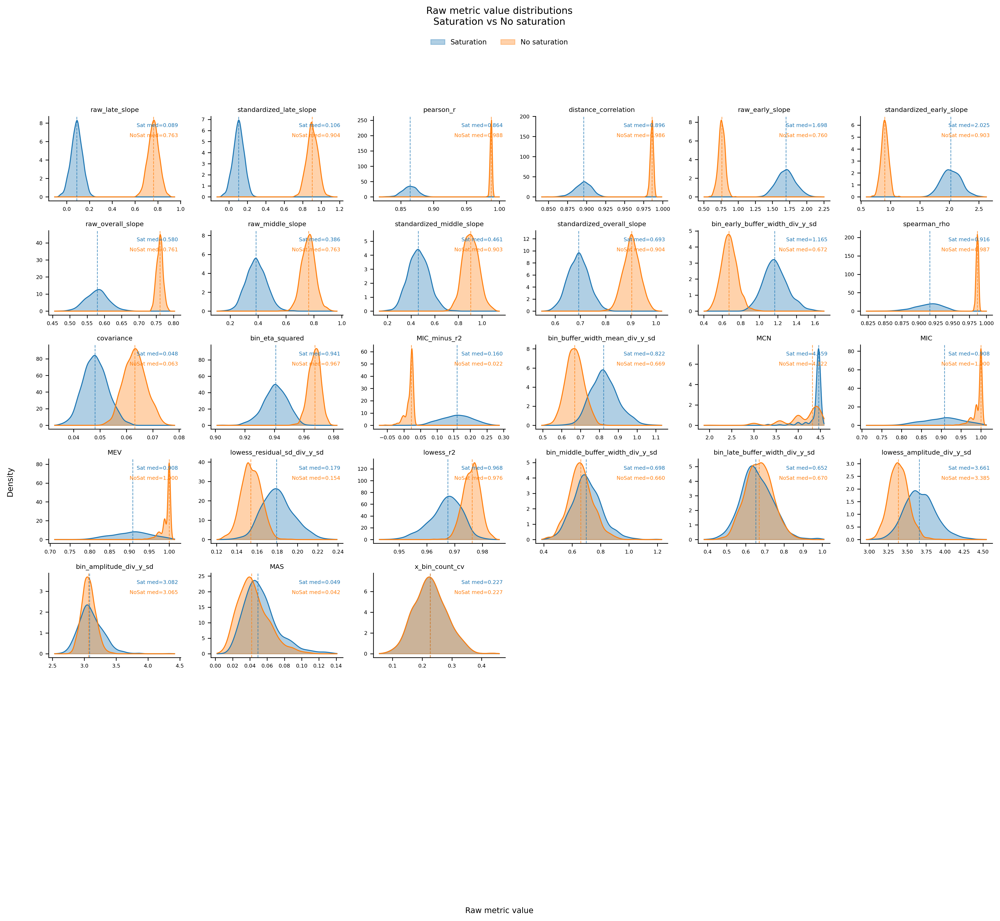

In [21]:
# ==========================================================
# 4. Plot raw metric value distributions
# ==========================================================

# Exclude sign-related metrics
exclude_keywords = [
    "sign",
    "direction",
]

metric_list = raw_metric_df["metric"].dropna().unique().tolist()

metric_list = [
    m for m in metric_list
    if not any(keyword in m.lower() for keyword in exclude_keywords)
]

# 如果已有 comparison_distribution_df，就按 integrated_score 排序
if "comparison_distribution_df" in globals():
    order_df = comparison_distribution_df.copy()

    order_df = order_df[
        order_df["metric"].isin(metric_list)
    ].sort_values(
        "integrated_score",
        ascending=False,
    )

    plot_metrics = order_df["metric"].tolist()

    # 防止有些 metric 不在 comparison_distribution_df 里
    remaining_metrics = [
        m for m in metric_list
        if m not in plot_metrics
    ]

    plot_metrics = plot_metrics + remaining_metrics

else:
    plot_metrics = metric_list


if top_k is not None:
    plot_metrics = plot_metrics[:top_k]


n_metrics = len(plot_metrics)
n_rows = math.ceil(n_metrics / n_cols)

# fig, axes = plt.subplots(
#     n_rows,
#     6,
#     figsize=(3.3 * n_cols, 2.4 * n_rows),
#     dpi=300,
# )

fig, axes = plt.subplots(
    n_rows,
    6,
    figsize=(4.0 * n_cols, 2 * n_rows),
    dpi=300,
)

axes = np.asarray(axes).reshape(-1)


for ax_idx, metric_name in enumerate(plot_metrics):

    ax = axes[ax_idx]

    sat_values = raw_metric_df.loc[
        (raw_metric_df["metric"] == metric_name)
        & (raw_metric_df["case"] == "Saturation"),
        "value"
    ].replace([np.inf, -np.inf], np.nan).dropna().values

    nosat_values = raw_metric_df.loc[
        (raw_metric_df["metric"] == metric_name)
        & (raw_metric_df["case"] == "No saturation"),
        "value"
    ].replace([np.inf, -np.inf], np.nan).dropna().values

    if len(sat_values) < 5 or len(nosat_values) < 5:
        ax.set_title(f"{metric_name}\nno valid values", fontsize=7)
        ax.axis("off")
        continue

    x_min = min(np.nanmin(sat_values), np.nanmin(nosat_values))
    x_max = max(np.nanmax(sat_values), np.nanmax(nosat_values))

    if x_max == x_min:
        ax.set_title(f"{metric_name}\nconstant values", fontsize=7)
        ax.axis("off")
        continue

    x_pad = 0.05 * (x_max - x_min)
    grid = np.linspace(x_min - x_pad, x_max + x_pad, 400)

    sat_density = safe_kde(sat_values, grid)
    nosat_density = safe_kde(nosat_values, grid)

    if (
        np.all(~np.isfinite(sat_density))
        or np.all(~np.isfinite(nosat_density))
    ):
        ax.set_title(f"{metric_name}\nKDE failed", fontsize=7)
        ax.axis("off")
        continue

    # Saturation raw distribution
    ax.fill_between(
        grid,
        sat_density,
        alpha=0.35,
        color=saturation_color,
        label="Saturation" if ax_idx == 0 else None,
    )

    ax.plot(
        grid,
        sat_density,
        color=saturation_color,
        linewidth=1.1,
    )

    # No saturation raw distribution
    ax.fill_between(
        grid,
        nosat_density,
        alpha=0.35,
        color=nosaturation_color,
        label="No saturation" if ax_idx == 0 else None,
    )

    ax.plot(
        grid,
        nosat_density,
        color=nosaturation_color,
        linewidth=1.1,
    )

    # Add medians
    sat_median = np.nanmedian(sat_values)
    nosat_median = np.nanmedian(nosat_values)

    ax.axvline(
        sat_median,
        color=saturation_color,
        linestyle="--",
        linewidth=0.8,
        alpha=0.75,
    )

    ax.axvline(
        nosat_median,
        color=nosaturation_color,
        linestyle="--",
        linewidth=0.8,
        alpha=0.75,
    )

    # Add text
    ax.text(
        0.98,
        0.92,
        f"Sat med={sat_median:.3f}",
        transform=ax.transAxes,
        ha="right",
        va="top",
        fontsize=6,
        color=saturation_color,
    )

    ax.text(
        0.98,
        0.80,
        f"NoSat med={nosat_median:.3f}",
        transform=ax.transAxes,
        ha="right",
        va="top",
        fontsize=6,
        color=nosaturation_color,
    )

    ax.set_title(
        metric_name,
        fontsize=7.5,
        pad=5,
    )

    ax.tick_params(axis="both", labelsize=6)

    for spine in ["top", "right"]:
        ax.spines[spine].set_visible(False)


# ----------------------------------------------------------
# 5. Remove unused axes
# ----------------------------------------------------------

for j in range(n_metrics, len(axes)):
    axes[j].axis("off")


# ----------------------------------------------------------
# 6. Shared legend and labels
# ----------------------------------------------------------

handles, labels = axes[0].get_legend_handles_labels()

fig.legend(
    handles,
    labels,
    loc="upper center",
    ncol=2,
    frameon=False,
    fontsize=8,
    bbox_to_anchor=(0.5, 1.01),
)

fig.suptitle(
    "Raw metric value distributions\n"
    "Saturation vs No saturation",
    fontsize=11,
    y=1.04,
)

fig.text(
    0.5,
    0.01,
    "Raw metric value",
    ha="center",
    fontsize=9,
)

fig.text(
    0.01,
    0.5,
    "Density",
    va="center",
    rotation="vertical",
    fontsize=9,
)

plt.tight_layout(rect=[0.03, 0.03, 1, 0.97])
plt.show()

baseline_diff_df shape: (1000, 29)
observed_diff_df shape: (1000, 29)
raw_metric_df shape: (56000, 4)
Summary table:


,metric,baseline_p95,baseline_p975,observed_median,observed_p05,observed_p95,exceed_rate_p95,exceed_rate_p975,ratio_observed_median_to_baseline_p95,difference_overlap_area,...,raw_median_difference,raw_overlap_area,raw_separation_area,ratio_capped,ratio_score,exceed_score,difference_separation_score,raw_separation_score,integrated_score,interpretation
0,raw_late_slope,0.134506,0.153697,0.674265,0.658830,0.685596,1.000,1.000,5.012883,1.152846e-235,...,0.673193,3.153308e-59,1.000000,5.000000,1.000000,1.000,1.000000,1.000000,1.000000,Strong
1,standardized_late_slope,0.159892,0.184362,0.799134,0.744522,0.853695,1.000,1.000,4.997970,9.219146e-92,...,0.797645,1.770015e-52,1.000000,4.997970,0.999594,1.000,1.000000,1.000000,0.999898,Strong
2,pearson_r,0.030255,0.033641,0.123301,0.106507,0.140655,1.000,1.000,4.075394,8.662240e-25,...,0.123397,4.013923e-161,1.000000,4.075394,0.815079,1.000,1.000000,1.000000,0.953770,Strong
3,distance_correlation,0.029302,0.034922,0.089449,0.074854,0.107806,1.000,1.000,3.052603,1.791662e-04,...,0.089708,3.084231e-62,1.000000,3.052603,0.610521,1.000,0.999821,1.000000,0.902585,Strong
4,raw_early_slope,0.380074,0.426833,0.938639,0.730953,1.146750,1.000,1.000,2.469620,4.499403e-03,...,0.937569,1.632130e-18,1.000000,2.469620,0.493924,1.000,0.995501,1.000000,0.872356,Strong
5,standardized_early_slope,0.465569,0.553386,1.122054,0.880616,1.379911,1.000,1.000,2.410073,4.336524e-03,...,1.121656,1.351001e-17,1.000000,2.410073,0.482015,1.000,0.995663,1.000000,0.869419,Strong
6,raw_overall_slope,0.090251,0.105810,0.180538,0.132912,0.231781,0.998,0.990,2.000407,3.426989e-02,...,0.180907,3.432969e-12,1.000000,2.000407,0.400081,0.998,0.965730,1.000000,0.840953,Strong
7,raw_middle_slope,0.194428,0.216818,0.378306,0.277496,0.457780,1.000,0.995,1.945733,3.225969e-02,...,0.377102,5.328392e-03,0.994672,1.945733,0.389147,1.000,0.967740,0.994672,0.837890,Strong
8,standardized_middle_slope,0.239178,0.270242,0.446888,0.315069,0.549949,0.995,0.986,1.868434,4.517416e-02,...,0.442250,5.063086e-03,0.994937,1.868434,0.373687,0.995,0.954826,0.994937,0.829612,Strong
9,standardized_overall_slope,0.115626,0.130560,0.211537,0.138182,0.283285,0.982,0.964,1.829495,6.680580e-02,...,0.210754,6.241667e-03,0.993758,1.829495,0.365899,0.982,0.933194,0.993758,0.818713,Strong


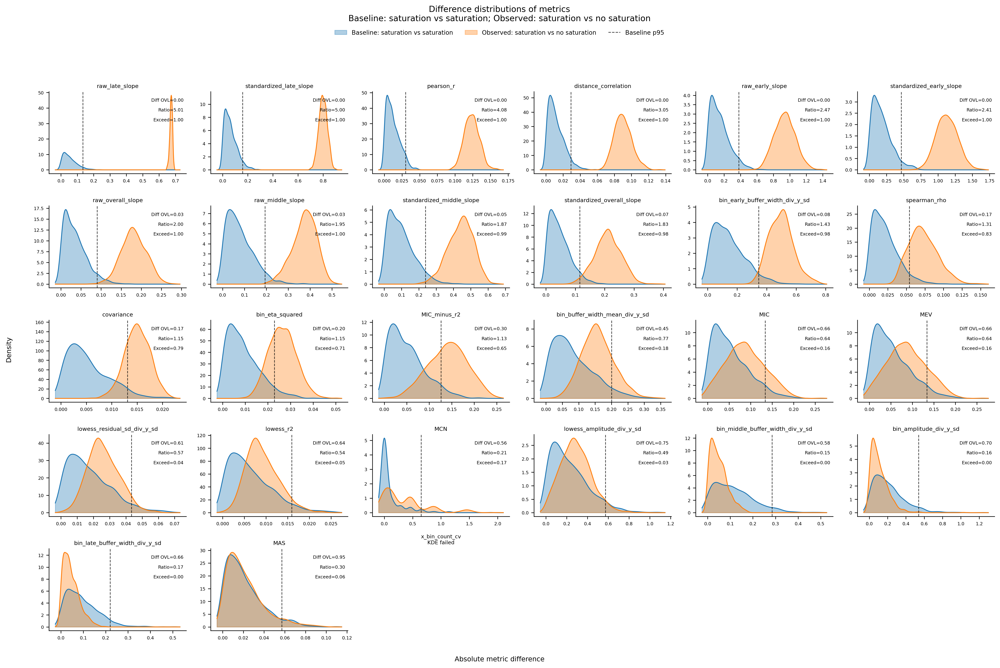

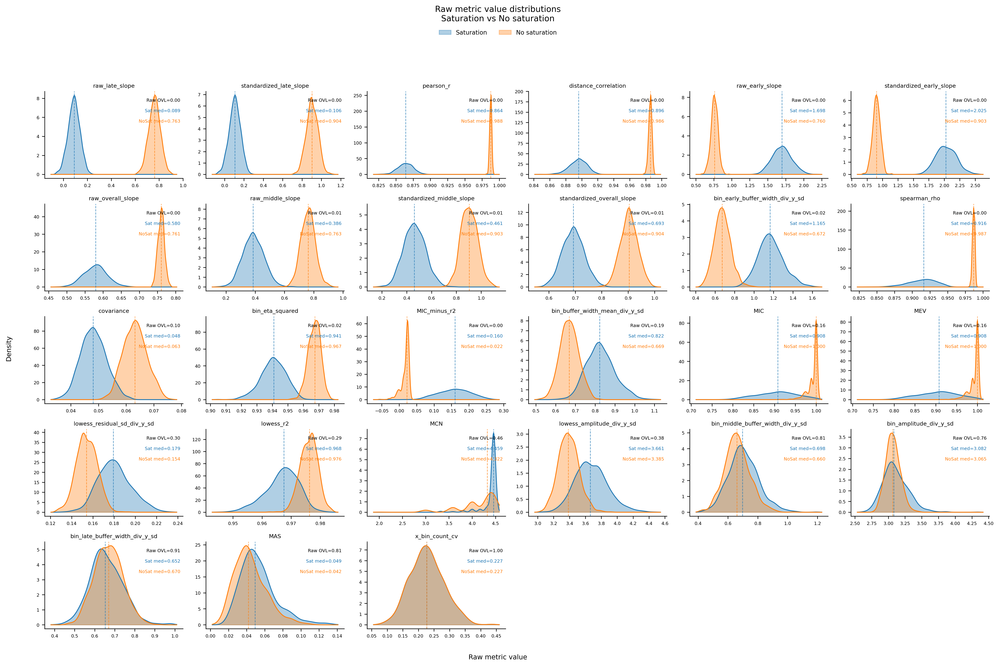

In [23]:
# ==========================================================
# Saturation test experiment
# Difference distribution + Raw value distribution
# With overlap area calculation
# ==========================================================

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import math

from scipy.stats import pearsonr, spearmanr, gaussian_kde
from scipy.spatial.distance import pdist, squareform
from statsmodels.nonparametric.smoothers_lowess import lowess


# ==========================================================
# Optional: MIC / MAS / MEV / MCN
# ==========================================================

try:
    from minepy import MINE
    HAS_MINEPY = True
except Exception:
    HAS_MINEPY = False
    print("minepy is not installed. MIC/MAS/MEV/MCN will be skipped.")


# ==========================================================
# 1. Data generation
# ==========================================================

def generate_saturation_data(
    seed,
    n=180,
    saturation=True,
    noise_sd=0.035,
    x_random=True,
):
    rng = np.random.default_rng(seed)

    if x_random:
        x = np.sort(rng.uniform(0, 1, n))
    else:
        x = np.linspace(0, 1, n)

    if saturation:
        # Saturation: early dynamic response, late plateau
        y_base = 0.12 + 0.76 * (1 - np.exp(-4.5 * x))
    else:
        # No saturation: approximately linear response
        y_base = 0.12 + 0.76 * x

    y = y_base + rng.normal(0, noise_sd, n)

    # Do not clip y, because clipping may artificially create or strengthen plateau
    return x, y


# ==========================================================
# 2. Basic metric helpers
# ==========================================================

def safe_pearson(x, y):
    x = np.asarray(x, dtype=float)
    y = np.asarray(y, dtype=float)

    valid = np.isfinite(x) & np.isfinite(y)
    x = x[valid]
    y = y[valid]

    if len(x) < 3 or np.nanstd(x) == 0 or np.nanstd(y) == 0:
        return np.nan

    return pearsonr(x, y)[0]


def safe_spearman(x, y):
    x = np.asarray(x, dtype=float)
    y = np.asarray(y, dtype=float)

    valid = np.isfinite(x) & np.isfinite(y)
    x = x[valid]
    y = y[valid]

    if len(x) < 3 or np.nanstd(x) == 0 or np.nanstd(y) == 0:
        return np.nan

    return spearmanr(x, y)[0]


def safe_covariance(x, y):
    x = np.asarray(x, dtype=float)
    y = np.asarray(y, dtype=float)

    valid = np.isfinite(x) & np.isfinite(y)
    x = x[valid]
    y = y[valid]

    if len(x) < 3 or np.nanstd(x) == 0 or np.nanstd(y) == 0:
        return np.nan

    return np.cov(x, y, ddof=1)[0, 1]


def distance_correlation(x, y):
    x = np.asarray(x, dtype=float).reshape(-1, 1)
    y = np.asarray(y, dtype=float).reshape(-1, 1)

    valid = np.isfinite(x[:, 0]) & np.isfinite(y[:, 0])
    x = x[valid]
    y = y[valid]

    if len(x) < 3:
        return np.nan

    a = squareform(pdist(x, metric="euclidean"))
    b = squareform(pdist(y, metric="euclidean"))

    A = a - a.mean(axis=0)[None, :] - a.mean(axis=1)[:, None] + a.mean()
    B = b - b.mean(axis=0)[None, :] - b.mean(axis=1)[:, None] + b.mean()

    dcov2_xy = np.mean(A * B)
    dcov2_xx = np.mean(A * A)
    dcov2_yy = np.mean(B * B)

    if dcov2_xx <= 0 or dcov2_yy <= 0:
        return np.nan

    return np.sqrt(dcov2_xy / np.sqrt(dcov2_xx * dcov2_yy))


def compute_mine_metrics(x, y):
    empty = {
        "MIC": np.nan,
        "MAS": np.nan,
        "MEV": np.nan,
        "MCN": np.nan,
        "MIC_minus_r2": np.nan,
    }

    if not HAS_MINEPY:
        return empty

    x = np.asarray(x, dtype=float)
    y = np.asarray(y, dtype=float)

    valid = np.isfinite(x) & np.isfinite(y)
    x = x[valid]
    y = y[valid]

    if len(x) < 5:
        return empty

    mine = MINE(alpha=0.6, c=15)
    mine.compute_score(x, y)

    mic = mine.mic()
    mas = mine.mas()
    mev = mine.mev()
    mcn = mine.mcn()

    r = safe_pearson(x, y)
    r2 = r ** 2 if np.isfinite(r) else np.nan

    return {
        "MIC": mic,
        "MAS": mas,
        "MEV": mev,
        "MCN": mcn,
        "MIC_minus_r2": mic - r2 if np.isfinite(r2) else np.nan,
    }


def minmax01(v):
    v = np.asarray(v, dtype=float)

    v_min = np.nanmin(v)
    v_max = np.nanmax(v)

    if not np.isfinite(v_min) or not np.isfinite(v_max):
        return np.full_like(v, np.nan)

    if v_max == v_min:
        return np.full_like(v, np.nan)

    return (v - v_min) / (v_max - v_min)


def segment_slope_fit(x_seg, y_seg):
    x_seg = np.asarray(x_seg, dtype=float)
    y_seg = np.asarray(y_seg, dtype=float)

    valid = np.isfinite(x_seg) & np.isfinite(y_seg)
    x_seg = x_seg[valid]
    y_seg = y_seg[valid]

    if len(x_seg) < 3 or np.nanstd(x_seg) == 0:
        return np.nan

    return np.polyfit(x_seg, y_seg, 1)[0]


def compute_segment_slopes(x, y, standardized=False):
    x = np.asarray(x, dtype=float)
    y = np.asarray(y, dtype=float)

    valid = np.isfinite(x) & np.isfinite(y)
    x = x[valid]
    y = y[valid]

    if len(x) < 6:
        return np.nan, np.nan, np.nan, np.nan

    order = np.argsort(x)
    x = x[order]
    y = y[order]

    if standardized:
        x = minmax01(x)
        y = minmax01(y)

    if np.all(~np.isfinite(x)) or np.all(~np.isfinite(y)):
        return np.nan, np.nan, np.nan, np.nan

    n = len(x)
    i1 = n // 3
    i2 = 2 * n // 3

    overall = segment_slope_fit(x, y)
    early = segment_slope_fit(x[:i1], y[:i1])
    middle = segment_slope_fit(x[i1:i2], y[i1:i2])
    late = segment_slope_fit(x[i2:], y[i2:])

    return overall, early, middle, late


def compute_x_bin_count_cv(x, n_bins=10):
    x = np.asarray(x, dtype=float)
    x = x[np.isfinite(x)]

    if len(x) == 0:
        return np.nan

    bins = pd.cut(
        x,
        bins=n_bins,
        labels=False,
        include_lowest=True,
        duplicates="drop",
    )

    counts = pd.Series(bins).value_counts().sort_index()
    counts = counts.reindex(np.arange(n_bins), fill_value=0)

    mean_count = counts.mean()
    sd_count = counts.std(ddof=1)

    if mean_count == 0:
        return np.nan

    return sd_count / mean_count


# ==========================================================
# 3. Bin-based metrics
# ==========================================================

def compute_bin_metrics(x, y, n_bins=10, min_count_per_bin=3):
    x = np.asarray(x, dtype=float)
    y = np.asarray(y, dtype=float)

    valid = np.isfinite(x) & np.isfinite(y)
    x = x[valid]
    y = y[valid]

    empty_result = {
        "bin_amplitude_div_y_sd": np.nan,
        "bin_eta_squared": np.nan,
        "bin_buffer_width_mean_div_y_sd": np.nan,
        "bin_early_buffer_width_div_y_sd": np.nan,
        "bin_middle_buffer_width_div_y_sd": np.nan,
        "bin_late_buffer_width_div_y_sd": np.nan,
    }

    if len(x) < n_bins:
        return empty_result

    y_sd = np.nanstd(y, ddof=1)

    bins = pd.cut(
        x,
        bins=n_bins,
        labels=False,
        include_lowest=True,
        duplicates="drop",
    )

    df = pd.DataFrame({
        "x": x,
        "y": y,
        "bin": bins,
    }).dropna()

    if df.empty:
        return empty_result

    bin_stats = []

    for bin_id, g in df.groupby("bin", observed=True):

        if len(g) < min_count_per_bin:
            continue

        y_min = g["y"].min()
        y_max = g["y"].max()

        bin_stats.append({
            "bin": bin_id,
            "x_mean": g["x"].mean(),
            "y_mean": g["y"].mean(),
            "y_min": y_min,
            "y_max": y_max,
            "buffer_width": y_max - y_min,
            "count": len(g),
        })

    if len(bin_stats) < 3:
        return empty_result

    bin_df = (
        pd.DataFrame(bin_stats)
        .sort_values("x_mean")
        .reset_index(drop=True)
    )

    amplitude = bin_df["y_mean"].max() - bin_df["y_mean"].min()

    if y_sd == 0 or not np.isfinite(y_sd):
        amplitude_div_y_sd = np.nan
        bin_df["buffer_width_div_y_sd"] = np.nan
    else:
        amplitude_div_y_sd = amplitude / y_sd
        bin_df["buffer_width_div_y_sd"] = bin_df["buffer_width"] / y_sd

    y_global_mean = df["y"].mean()
    ss_total = np.sum((df["y"] - y_global_mean) ** 2)

    ss_between = 0.0

    for _, g in df.groupby("bin", observed=True):
        if len(g) < min_count_per_bin:
            continue

        y_bin_mean = g["y"].mean()
        ss_between += len(g) * (y_bin_mean - y_global_mean) ** 2

    eta_squared = ss_between / ss_total if ss_total > 0 else np.nan

    n_valid_bins = len(bin_df)
    i1 = n_valid_bins // 3
    i2 = 2 * n_valid_bins // 3

    buffer_mean = bin_df["buffer_width_div_y_sd"].mean()
    buffer_early = bin_df.iloc[:i1]["buffer_width_div_y_sd"].mean()
    buffer_middle = bin_df.iloc[i1:i2]["buffer_width_div_y_sd"].mean()
    buffer_late = bin_df.iloc[i2:]["buffer_width_div_y_sd"].mean()

    return {
        "bin_amplitude_div_y_sd": amplitude_div_y_sd,
        "bin_eta_squared": eta_squared,
        "bin_buffer_width_mean_div_y_sd": buffer_mean,
        "bin_early_buffer_width_div_y_sd": buffer_early,
        "bin_middle_buffer_width_div_y_sd": buffer_middle,
        "bin_late_buffer_width_div_y_sd": buffer_late,
    }


# ==========================================================
# 4. LOWESS metrics
# ==========================================================

def compute_lowess_metrics(x, y, frac=0.25):
    x = np.asarray(x, dtype=float)
    y = np.asarray(y, dtype=float)

    valid = np.isfinite(x) & np.isfinite(y)
    x = x[valid]
    y = y[valid]

    empty_result = {
        "lowess_amplitude_div_y_sd": np.nan,
        "lowess_residual_sd_div_y_sd": np.nan,
        "lowess_r2": np.nan,
        "lowess_sign_changes": np.nan,
    }

    if len(x) < 10:
        return empty_result

    order = np.argsort(x)
    x_sorted = x[order]
    y_sorted = y[order]

    fitted = lowess(
        endog=y_sorted,
        exog=x_sorted,
        frac=frac,
        return_sorted=True,
    )

    x_fit = fitted[:, 0]
    y_fit = fitted[:, 1]

    y_pred = np.interp(x_sorted, x_fit, y_fit)

    residual = y_sorted - y_pred
    y_sd = np.nanstd(y_sorted, ddof=1)

    amplitude = np.nanmax(y_fit) - np.nanmin(y_fit)

    if y_sd == 0 or not np.isfinite(y_sd):
        amplitude_div_y_sd = np.nan
        residual_sd_div_y_sd = np.nan
    else:
        amplitude_div_y_sd = amplitude / y_sd
        residual_sd_div_y_sd = np.nanstd(residual, ddof=1) / y_sd

    ss_res = np.sum((y_sorted - y_pred) ** 2)
    ss_tot = np.sum((y_sorted - np.nanmean(y_sorted)) ** 2)

    lowess_r2 = 1 - ss_res / ss_tot if ss_tot > 0 else np.nan

    dx = np.gradient(x_fit)
    dy = np.gradient(y_fit)

    with np.errstate(divide="ignore", invalid="ignore"):
        derivative = dy / dx

    sign = np.sign(derivative)
    sign[sign == 0] = np.nan

    valid_sign = np.isfinite(sign)

    if valid_sign.sum() < 2:
        sign_changes = np.nan
    else:
        sign_valid = sign[valid_sign]
        sign_changes = np.sum(sign_valid[1:] != sign_valid[:-1])

    return {
        "lowess_amplitude_div_y_sd": amplitude_div_y_sd,
        "lowess_residual_sd_div_y_sd": residual_sd_div_y_sd,
        "lowess_r2": lowess_r2,
        "lowess_sign_changes": sign_changes,
    }


# ==========================================================
# 5. Compute all metrics
# ==========================================================

def compute_all_metrics(x, y):
    x = np.asarray(x, dtype=float)
    y = np.asarray(y, dtype=float)

    valid = np.isfinite(x) & np.isfinite(y)
    x = x[valid]
    y = y[valid]

    metrics = {}

    # Correlation-based
    metrics["pearson_r"] = safe_pearson(x, y)
    metrics["spearman_rho"] = safe_spearman(x, y)
    metrics["covariance"] = safe_covariance(x, y)

    # Distance-based
    metrics["distance_correlation"] = distance_correlation(x, y)

    # Information-based
    metrics.update(compute_mine_metrics(x, y))

    # Density
    metrics["x_bin_count_cv"] = compute_x_bin_count_cv(x, n_bins=10)

    # Raw slopes
    (
        metrics["raw_overall_slope"],
        metrics["raw_early_slope"],
        metrics["raw_middle_slope"],
        metrics["raw_late_slope"],
    ) = compute_segment_slopes(x, y, standardized=False)

    # Standardized slopes
    (
        metrics["standardized_overall_slope"],
        metrics["standardized_early_slope"],
        metrics["standardized_middle_slope"],
        metrics["standardized_late_slope"],
    ) = compute_segment_slopes(x, y, standardized=True)

    # Bin-based
    metrics.update(
        compute_bin_metrics(
            x,
            y,
            n_bins=10,
            min_count_per_bin=3,
        )
    )

    # LOWESS-based
    metrics.update(
        compute_lowess_metrics(
            x,
            y,
            frac=0.25,
        )
    )

    return metrics


# ==========================================================
# 6. Overlap helpers
# ==========================================================

def distribution_overlap_area(a, b, grid_size=1000):
    """
    Overlap coefficient between two KDE distributions.
    OVL = integral min(f_a(x), f_b(x)) dx

    0 = no overlap
    1 = complete overlap
    """

    a = (
        pd.Series(a)
        .replace([np.inf, -np.inf], np.nan)
        .dropna()
        .values
    )

    b = (
        pd.Series(b)
        .replace([np.inf, -np.inf], np.nan)
        .dropna()
        .values
    )

    if len(a) < 5 or len(b) < 5:
        return np.nan

    if np.nanstd(a) == 0 or np.nanstd(b) == 0:
        return np.nan

    x_min = min(np.nanmin(a), np.nanmin(b))
    x_max = max(np.nanmax(a), np.nanmax(b))

    if x_max == x_min:
        return np.nan

    x_pad = 0.05 * (x_max - x_min)
    grid = np.linspace(x_min - x_pad, x_max + x_pad, grid_size)

    kde_a = gaussian_kde(a)
    kde_b = gaussian_kde(b)

    density_a = kde_a(grid)
    density_b = kde_b(grid)

    overlap_area = np.trapz(
        np.minimum(density_a, density_b),
        grid
    )

    return overlap_area


def safe_kde(values, grid):
    values = (
        pd.Series(values)
        .replace([np.inf, -np.inf], np.nan)
        .dropna()
        .values
    )

    if len(values) < 5:
        return np.full_like(grid, np.nan, dtype=float)

    if np.nanstd(values) == 0:
        return np.full_like(grid, np.nan, dtype=float)

    kde = gaussian_kde(values)
    return kde(grid)


# ==========================================================
# 7. Experiment settings
# ==========================================================

n_runs = 1000
noise_sd = 0.035
x_random = True

n_cols = 6          # 可以改，比如 3, 4, 5, 6
top_k = None        # 如果只画前20个，改成 top_k = 20


# ==========================================================
# 8. Generate difference distributions and raw value distributions
# ==========================================================

baseline_diff_records = []
observed_diff_records = []
raw_records = []

for seed in range(n_runs):

    # --------------------------
    # Baseline: saturation vs saturation
    # --------------------------
    x_sat_a, y_sat_a = generate_saturation_data(
        seed=seed,
        saturation=True,
        noise_sd=noise_sd,
        x_random=x_random,
    )

    x_sat_b, y_sat_b = generate_saturation_data(
        seed=seed + 10000,
        saturation=True,
        noise_sd=noise_sd,
        x_random=x_random,
    )

    metrics_sat_a = compute_all_metrics(x_sat_a, y_sat_a)
    metrics_sat_b = compute_all_metrics(x_sat_b, y_sat_b)

    baseline_record = {"seed": seed}

    for metric_name in metrics_sat_a.keys():
        value_a = metrics_sat_a.get(metric_name, np.nan)
        value_b = metrics_sat_b.get(metric_name, np.nan)
        baseline_record[metric_name] = abs(value_a - value_b)

    baseline_diff_records.append(baseline_record)

    # --------------------------
    # Observed: saturation vs no saturation
    # paired seed to control x and noise structure
    # --------------------------
    x_sat, y_sat = generate_saturation_data(
        seed=seed,
        saturation=True,
        noise_sd=noise_sd,
        x_random=x_random,
    )

    x_nosat, y_nosat = generate_saturation_data(
        seed=seed,
        saturation=False,
        noise_sd=noise_sd,
        x_random=x_random,
    )

    metrics_sat = compute_all_metrics(x_sat, y_sat)
    metrics_nosat = compute_all_metrics(x_nosat, y_nosat)

    observed_record = {"seed": seed}

    for metric_name in metrics_sat.keys():
        sat_value = metrics_sat.get(metric_name, np.nan)
        nosat_value = metrics_nosat.get(metric_name, np.nan)
        observed_record[metric_name] = abs(sat_value - nosat_value)

        raw_records.append({
            "seed": seed,
            "case": "Saturation",
            "metric": metric_name,
            "value": sat_value,
        })

        raw_records.append({
            "seed": seed,
            "case": "No saturation",
            "metric": metric_name,
            "value": nosat_value,
        })

    observed_diff_records.append(observed_record)


baseline_diff_df = pd.DataFrame(baseline_diff_records)
observed_diff_df = pd.DataFrame(observed_diff_records)
raw_metric_df = pd.DataFrame(raw_records)


print("baseline_diff_df shape:", baseline_diff_df.shape)
print("observed_diff_df shape:", observed_diff_df.shape)
print("raw_metric_df shape:", raw_metric_df.shape)


# ==========================================================
# 9. Summary table: difference overlap + raw overlap
# ==========================================================

metric_names = [
    c for c in baseline_diff_df.columns
    if c != "seed"
]

exclude_keywords = [
    "sign",
    "direction",
]

metric_names = [
    m for m in metric_names
    if not any(keyword in m.lower() for keyword in exclude_keywords)
]

summary_records = []

for metric_name in metric_names:

    # --------------------------
    # Difference distributions
    # --------------------------
    baseline_values = (
        baseline_diff_df[metric_name]
        .replace([np.inf, -np.inf], np.nan)
        .dropna()
    )

    observed_values = (
        observed_diff_df[metric_name]
        .replace([np.inf, -np.inf], np.nan)
        .dropna()
    )

    if len(baseline_values) == 0 or len(observed_values) == 0:
        continue

    baseline_p95 = baseline_values.quantile(0.95)
    baseline_p975 = baseline_values.quantile(0.975)

    observed_median = observed_values.median()
    observed_p05 = observed_values.quantile(0.05)
    observed_p95 = observed_values.quantile(0.95)

    exceed_rate_p95 = np.mean(observed_values > baseline_p95)
    exceed_rate_p975 = np.mean(observed_values > baseline_p975)

    ratio_observed_median_to_baseline_p95 = (
        observed_median / baseline_p95
        if baseline_p95 > 0
        else np.nan
    )

    difference_overlap_area = distribution_overlap_area(
        baseline_values,
        observed_values
    )

    difference_separation_area = (
        1 - difference_overlap_area
        if np.isfinite(difference_overlap_area)
        else np.nan
    )

    # --------------------------
    # Raw value distributions
    # --------------------------
    sat_raw_values = raw_metric_df.loc[
        (raw_metric_df["metric"] == metric_name)
        & (raw_metric_df["case"] == "Saturation"),
        "value"
    ]

    nosat_raw_values = raw_metric_df.loc[
        (raw_metric_df["metric"] == metric_name)
        & (raw_metric_df["case"] == "No saturation"),
        "value"
    ]

    raw_overlap_area = distribution_overlap_area(
        sat_raw_values,
        nosat_raw_values
    )

    raw_separation_area = (
        1 - raw_overlap_area
        if np.isfinite(raw_overlap_area)
        else np.nan
    )

    sat_raw_median = (
        sat_raw_values
        .replace([np.inf, -np.inf], np.nan)
        .dropna()
        .median()
    )

    nosat_raw_median = (
        nosat_raw_values
        .replace([np.inf, -np.inf], np.nan)
        .dropna()
        .median()
    )

    raw_median_difference = abs(sat_raw_median - nosat_raw_median)

    summary_records.append({
        "metric": metric_name,

        # Difference distribution summary
        "baseline_p95": baseline_p95,
        "baseline_p975": baseline_p975,
        "observed_median": observed_median,
        "observed_p05": observed_p05,
        "observed_p95": observed_p95,
        "exceed_rate_p95": exceed_rate_p95,
        "exceed_rate_p975": exceed_rate_p975,
        "ratio_observed_median_to_baseline_p95": ratio_observed_median_to_baseline_p95,
        "difference_overlap_area": difference_overlap_area,
        "difference_separation_area": difference_separation_area,

        # Raw value distribution summary
        "saturation_raw_median": sat_raw_median,
        "no_saturation_raw_median": nosat_raw_median,
        "raw_median_difference": raw_median_difference,
        "raw_overlap_area": raw_overlap_area,
        "raw_separation_area": raw_separation_area,
    })


summary_df = pd.DataFrame(summary_records)


# ==========================================================
# 10. Integrated score and label
# ==========================================================

summary_df["ratio_capped"] = (
    summary_df["ratio_observed_median_to_baseline_p95"]
    .clip(upper=5)
)

summary_df["ratio_score"] = summary_df["ratio_capped"] / 5
summary_df["exceed_score"] = summary_df["exceed_rate_p95"]
summary_df["difference_separation_score"] = summary_df["difference_separation_area"]
summary_df["raw_separation_score"] = summary_df["raw_separation_area"]

summary_df["integrated_score"] = (
    summary_df["ratio_score"]
    + summary_df["exceed_score"]
    + summary_df["difference_separation_score"]
    + summary_df["raw_separation_score"]
) / 4


def classify_metric(row):
    difference_overlap = row["difference_overlap_area"]
    raw_overlap = row["raw_overlap_area"]
    exceed = row["exceed_rate_p95"]
    ratio = row["ratio_observed_median_to_baseline_p95"]

    if not np.isfinite(difference_overlap) or not np.isfinite(raw_overlap):
        return "Invalid"

    if (
        difference_overlap <= 0.2
        and raw_overlap <= 0.2
        and exceed >= 0.9
        and ratio >= 1
    ):
        return "Strong"

    elif (
        difference_overlap <= 0.5
        and raw_overlap <= 0.5
        and exceed >= 0.7
        and ratio >= 0.8
    ):
        return "Moderate"

    elif (
        difference_overlap <= 0.8
        and raw_overlap <= 0.8
        and exceed >= 0.5
        and ratio >= 0.5
    ):
        return "Weak"

    else:
        return "Not distinguishable"


summary_df["interpretation"] = summary_df.apply(
    classify_metric,
    axis=1
)

summary_df = summary_df.sort_values(
    "integrated_score",
    ascending=False
).reset_index(drop=True)

print("Summary table:")
display(summary_df)


# ==========================================================
# 11. Plot 1: Difference distributions
# Baseline vs Observed
# ==========================================================

def plot_difference_distributions(
    summary_df,
    baseline_diff_df,
    observed_diff_df,
    n_cols=6,
    top_k=None,
):
    plot_metrics = summary_df.sort_values(
        "integrated_score",
        ascending=False
    )["metric"].tolist()

    if top_k is not None:
        plot_metrics = plot_metrics[:top_k]

    n_metrics = len(plot_metrics)
    n_rows = math.ceil(n_metrics / n_cols)

    baseline_color = "tab:blue"
    observed_color = "tab:orange"
    p95_color = "black"

    fig, axes = plt.subplots(
        n_rows,
        n_cols,
        figsize=(3.1 * n_cols, 2.35 * n_rows),
        dpi=300,
    )

    axes = np.asarray(axes).reshape(-1)

    for ax_idx, metric_name in enumerate(plot_metrics):

        ax = axes[ax_idx]

        baseline_values = (
            baseline_diff_df[metric_name]
            .replace([np.inf, -np.inf], np.nan)
            .dropna()
            .values
        )

        observed_values = (
            observed_diff_df[metric_name]
            .replace([np.inf, -np.inf], np.nan)
            .dropna()
            .values
        )

        if len(baseline_values) < 5 or len(observed_values) < 5:
            ax.set_title(f"{metric_name}\nno valid values", fontsize=7)
            ax.axis("off")
            continue

        x_min = min(np.nanmin(baseline_values), np.nanmin(observed_values))
        x_max = max(np.nanmax(baseline_values), np.nanmax(observed_values))

        if x_max == x_min:
            ax.set_title(f"{metric_name}\nconstant values", fontsize=7)
            ax.axis("off")
            continue

        x_pad = 0.05 * (x_max - x_min)
        grid = np.linspace(x_min - x_pad, x_max + x_pad, 400)

        baseline_density = safe_kde(baseline_values, grid)
        observed_density = safe_kde(observed_values, grid)

        if (
            np.all(~np.isfinite(baseline_density))
            or np.all(~np.isfinite(observed_density))
        ):
            ax.set_title(f"{metric_name}\nKDE failed", fontsize=7)
            ax.axis("off")
            continue

        baseline_p95 = np.nanquantile(baseline_values, 0.95)

        row = summary_df.loc[
            summary_df["metric"] == metric_name
        ].iloc[0]

        overlap_text = f"Diff OVL={row['difference_overlap_area']:.2f}"
        ratio_text = f"Ratio={row['ratio_observed_median_to_baseline_p95']:.2f}"
        exceed_text = f"Exceed={row['exceed_rate_p95']:.2f}"

        ax.fill_between(
            grid,
            baseline_density,
            alpha=0.35,
            color=baseline_color,
            label="Baseline: saturation vs saturation" if ax_idx == 0 else None,
        )

        ax.plot(
            grid,
            baseline_density,
            color=baseline_color,
            linewidth=1.1,
        )

        ax.fill_between(
            grid,
            observed_density,
            alpha=0.35,
            color=observed_color,
            label="Observed: saturation vs no saturation" if ax_idx == 0 else None,
        )

        ax.plot(
            grid,
            observed_density,
            color=observed_color,
            linewidth=1.1,
        )

        ax.axvline(
            baseline_p95,
            color=p95_color,
            linestyle="--",
            linewidth=0.9,
            alpha=0.75,
            label="Baseline p95" if ax_idx == 0 else None,
        )

        ax.text(
            0.98,
            0.92,
            overlap_text,
            transform=ax.transAxes,
            ha="right",
            va="top",
            fontsize=6,
        )

        ax.text(
            0.98,
            0.80,
            ratio_text,
            transform=ax.transAxes,
            ha="right",
            va="top",
            fontsize=6,
        )

        ax.text(
            0.98,
            0.68,
            exceed_text,
            transform=ax.transAxes,
            ha="right",
            va="top",
            fontsize=6,
        )

        ax.set_title(
            metric_name,
            fontsize=7.5,
            pad=5,
        )

        ax.tick_params(axis="both", labelsize=6)

        for spine in ["top", "right"]:
            ax.spines[spine].set_visible(False)

    for j in range(n_metrics, len(axes)):
        axes[j].axis("off")

    handles, labels = axes[0].get_legend_handles_labels()

    fig.legend(
        handles,
        labels,
        loc="upper center",
        ncol=3,
        frameon=False,
        fontsize=8,
        bbox_to_anchor=(0.5, 1.01),
    )

    fig.suptitle(
        "Difference distributions of metrics\n"
        "Baseline: saturation vs saturation; Observed: saturation vs no saturation",
        fontsize=11,
        y=1.04,
    )

    fig.text(
        0.5,
        0.01,
        "Absolute metric difference",
        ha="center",
        fontsize=9,
    )

    fig.text(
        0.01,
        0.5,
        "Density",
        va="center",
        rotation="vertical",
        fontsize=9,
    )

    plt.tight_layout(rect=[0.03, 0.03, 1, 0.97])
    plt.show()


# ==========================================================
# 12. Plot 2: Raw metric value distributions
# Saturation vs No saturation
# ==========================================================
# ==========================================================
# Plot raw metric value distributions with overlapped area shaded
# Saturation vs No saturation
# ==========================================================

def plot_raw_value_distributions_with_overlap(
    summary_df,
    raw_metric_df,
    n_cols=6,
    top_k=None,
):
    plot_metrics = summary_df.sort_values(
        "integrated_score",
        ascending=False
    )["metric"].tolist()

    if top_k is not None:
        plot_metrics = plot_metrics[:top_k]

    n_metrics = len(plot_metrics)
    n_rows = math.ceil(n_metrics / n_cols)

    saturation_color = "tab:blue"
    nosaturation_color = "tab:orange"
    overlap_color = "gray"

    fig, axes = plt.subplots(
        n_rows,
        n_cols,
        figsize=(3.1 * n_cols, 2.35 * n_rows),
        dpi=300,
    )

    axes = np.asarray(axes).reshape(-1)

    for ax_idx, metric_name in enumerate(plot_metrics):

        ax = axes[ax_idx]

        sat_values = raw_metric_df.loc[
            (raw_metric_df["metric"] == metric_name)
            & (raw_metric_df["case"] == "Saturation"),
            "value"
        ].replace([np.inf, -np.inf], np.nan).dropna().values

        nosat_values = raw_metric_df.loc[
            (raw_metric_df["metric"] == metric_name)
            & (raw_metric_df["case"] == "No saturation"),
            "value"
        ].replace([np.inf, -np.inf], np.nan).dropna().values

        if len(sat_values) < 5 or len(nosat_values) < 5:
            ax.set_title(f"{metric_name}\nno valid values", fontsize=7)
            ax.axis("off")
            continue

        x_min = min(np.nanmin(sat_values), np.nanmin(nosat_values))
        x_max = max(np.nanmax(sat_values), np.nanmax(nosat_values))

        if x_max == x_min:
            ax.set_title(f"{metric_name}\nconstant values", fontsize=7)
            ax.axis("off")
            continue

        x_pad = 0.05 * (x_max - x_min)
        grid = np.linspace(x_min - x_pad, x_max + x_pad, 500)

        sat_density = safe_kde(sat_values, grid)
        nosat_density = safe_kde(nosat_values, grid)

        if (
            np.all(~np.isfinite(sat_density))
            or np.all(~np.isfinite(nosat_density))
        ):
            ax.set_title(f"{metric_name}\nKDE failed", fontsize=7)
            ax.axis("off")
            continue

        # --------------------------------------------------
        # Compute overlap area on the same grid
        # --------------------------------------------------
        overlap_density = np.minimum(sat_density, nosat_density)

        raw_overlap_area = np.trapz(
            overlap_density,
            grid
        )

        sat_median = np.nanmedian(sat_values)
        nosat_median = np.nanmedian(nosat_values)

        # --------------------------------------------------
        # Plot original two distributions
        # --------------------------------------------------
        ax.fill_between(
            grid,
            sat_density,
            alpha=0.22,
            color=saturation_color,
            label="Saturation" if ax_idx == 0 else None,
        )

        ax.plot(
            grid,
            sat_density,
            color=saturation_color,
            linewidth=1.1,
        )

        ax.fill_between(
            grid,
            nosat_density,
            alpha=0.22,
            color=nosaturation_color,
            label="No saturation" if ax_idx == 0 else None,
        )

        ax.plot(
            grid,
            nosat_density,
            color=nosaturation_color,
            linewidth=1.1,
        )

        # --------------------------------------------------
        # Plot overlapped area directly on the original figure
        # --------------------------------------------------
        ax.fill_between(
            grid,
            overlap_density,
            alpha=0.45,
            color=overlap_color,
            label="Overlap area" if ax_idx == 0 else None,
        )

        # Median lines
        ax.axvline(
            sat_median,
            color=saturation_color,
            linestyle="--",
            linewidth=0.8,
            alpha=0.75,
        )

        ax.axvline(
            nosat_median,
            color=nosaturation_color,
            linestyle="--",
            linewidth=0.8,
            alpha=0.75,
        )

        # --------------------------------------------------
        # Text labels
        # --------------------------------------------------
        ax.text(
            0.98,
            0.92,
            f"Overlap={raw_overlap_area:.2f}",
            transform=ax.transAxes,
            ha="right",
            va="top",
            fontsize=6,
        )

        ax.text(
            0.98,
            0.80,
            f"Sat med={sat_median:.3f}",
            transform=ax.transAxes,
            ha="right",
            va="top",
            fontsize=6,
            color=saturation_color,
        )

        ax.text(
            0.98,
            0.68,
            f"NoSat med={nosat_median:.3f}",
            transform=ax.transAxes,
            ha="right",
            va="top",
            fontsize=6,
            color=nosaturation_color,
        )

        ax.set_title(
            metric_name,
            fontsize=7.5,
            pad=5,
        )

        ax.tick_params(axis="both", labelsize=6)

        for spine in ["top", "right"]:
            ax.spines[spine].set_visible(False)

    # Remove unused axes
    for j in range(n_metrics, len(axes)):
        axes[j].axis("off")

    handles, labels = axes[0].get_legend_handles_labels()

    fig.legend(
        handles,
        labels,
        loc="upper center",
        ncol=3,
        frameon=False,
        fontsize=8,
        bbox_to_anchor=(0.5, 1.01),
    )

    fig.suptitle(
        "Raw metric value distributions with overlap area\n"
        "Saturation vs No saturation",
        fontsize=11,
        y=1.04,
    )

    fig.text(
        0.5,
        0.01,
        "Raw metric value",
        ha="center",
        fontsize=9,
    )

    fig.text(
        0.01,
        0.5,
        "Density",
        va="center",
        rotation="vertical",
        fontsize=9,
    )

    plt.tight_layout(rect=[0.03, 0.03, 1, 0.97])
    plt.show()


# ==========================================================
# 13. Run plots
# ==========================================================


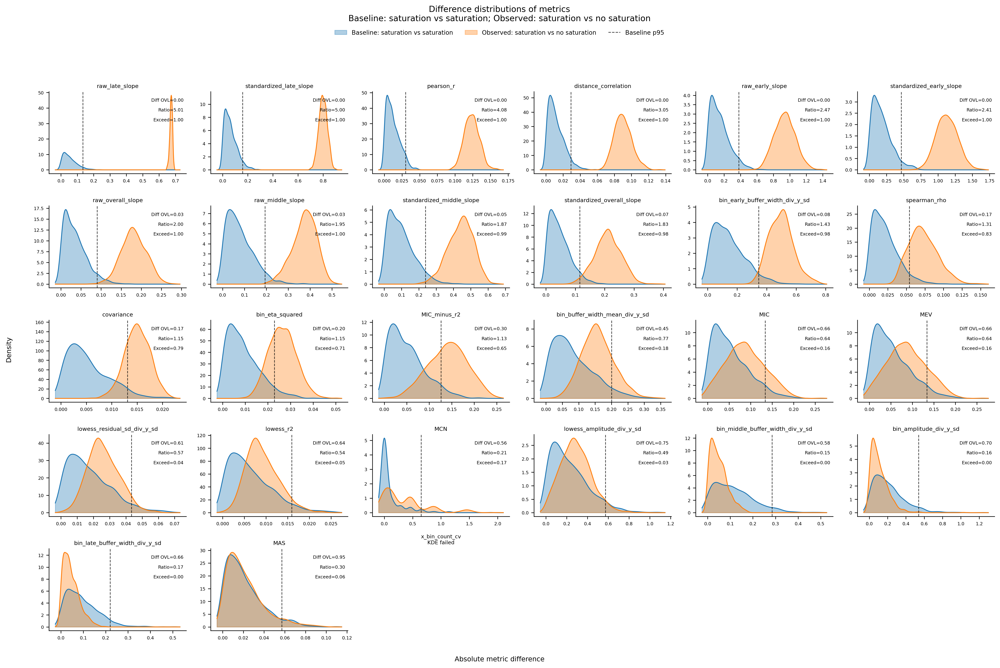

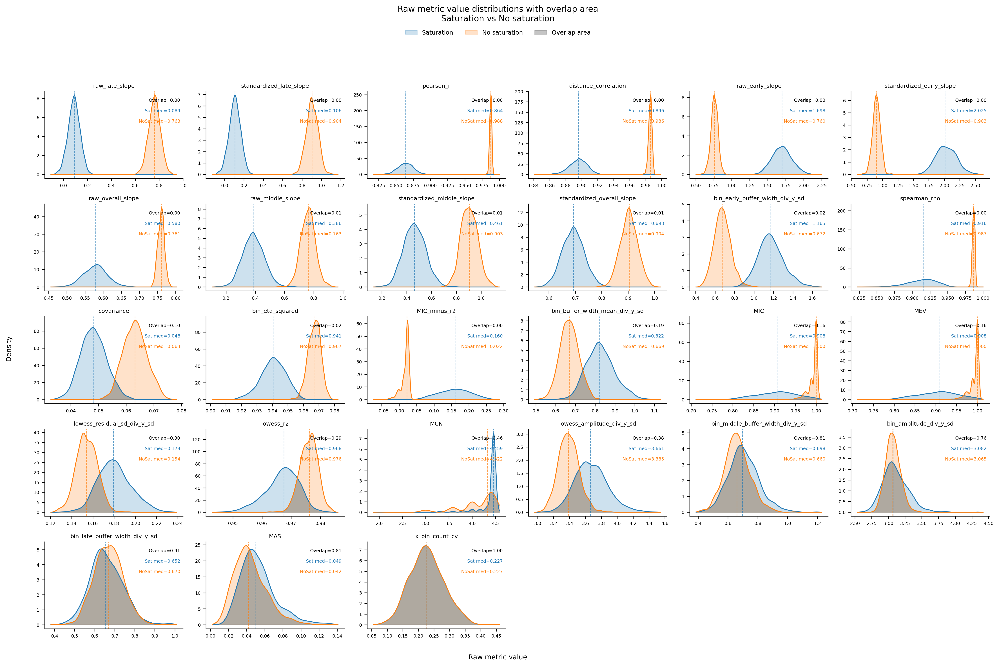

In [24]:

plot_difference_distributions(
    summary_df=summary_df,
    baseline_diff_df=baseline_diff_df,
    observed_diff_df=observed_diff_df,
    n_cols=n_cols,
    top_k=top_k,
)

plot_raw_value_distributions_with_overlap(
    summary_df=summary_df,
    raw_metric_df=raw_metric_df,
    n_cols=n_cols,
    top_k=top_k,
)

,metric,no_saturation_value,saturation_value,observed_difference,baseline_mean,baseline_sd,baseline_min,baseline_max,baseline_range,baseline_q025,baseline_q975,baseline_95_width,ratio_to_baseline_95_width,ratio_to_baseline_sd,larger_than_baseline_95_width,larger_than_baseline_range
0,pearson r,0.9857,0.8709,0.1148,0.862892,0.006583,0.838868,0.887807,0.048939,0.849670,0.875083,0.025413,4.517388,17.438038,True,True
1,curve amplitude,3.3301,3.5946,0.2645,0.724530,0.015603,0.673419,0.794991,0.121572,0.694699,0.756956,0.062257,4.248534,16.951719,True,True
2,raw early slope,0.5978,1.3354,0.7376,1.725412,0.047012,1.573806,1.882380,0.308575,1.635377,1.817937,0.182559,4.040329,15.689742,True,True
3,distance correlation,0.9842,0.8992,0.0850,0.895409,0.006326,0.874489,0.916296,0.041808,0.883355,0.906848,0.023493,3.618115,13.435558,True,True
4,raw late slope,0.4970,-0.0470,0.5440,0.085508,0.047519,-0.078194,0.227587,0.305781,-0.005720,0.177015,0.182735,2.976989,11.448133,True,True
5,standardized early slope,0.6910,1.6519,0.9609,2.058045,0.085612,1.757871,2.335100,0.577229,1.890019,2.221328,0.331309,2.900312,11.223940,True,True
6,standardized late slope,0.5745,-0.0582,0.6327,0.101968,0.056829,-0.094837,0.266173,0.361010,-0.006733,0.212548,0.219281,2.885344,11.133448,True,True
7,raw middle slope,0.5066,0.0368,0.4698,0.381123,0.045603,0.241673,0.519664,0.277991,0.296202,0.469690,0.173487,2.707976,10.301904,True,True
8,standardized middle slope,0.5856,0.0455,0.5401,0.454620,0.056416,0.297453,0.617825,0.320372,0.351448,0.567630,0.216182,2.498353,9.573454,True,True
9,spearman rho,0.9866,0.9170,0.0696,0.916756,0.011728,0.876352,0.959336,0.082984,0.891336,0.937495,0.046159,1.507834,5.934494,True,False


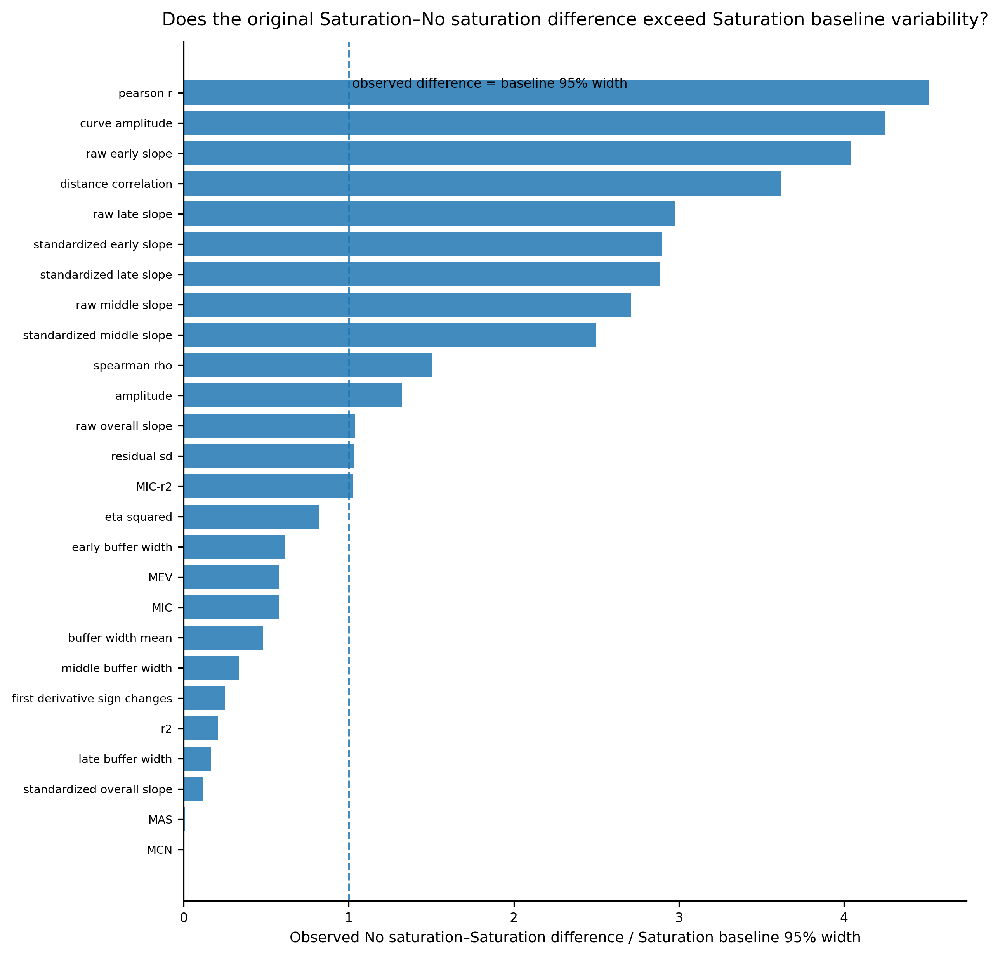

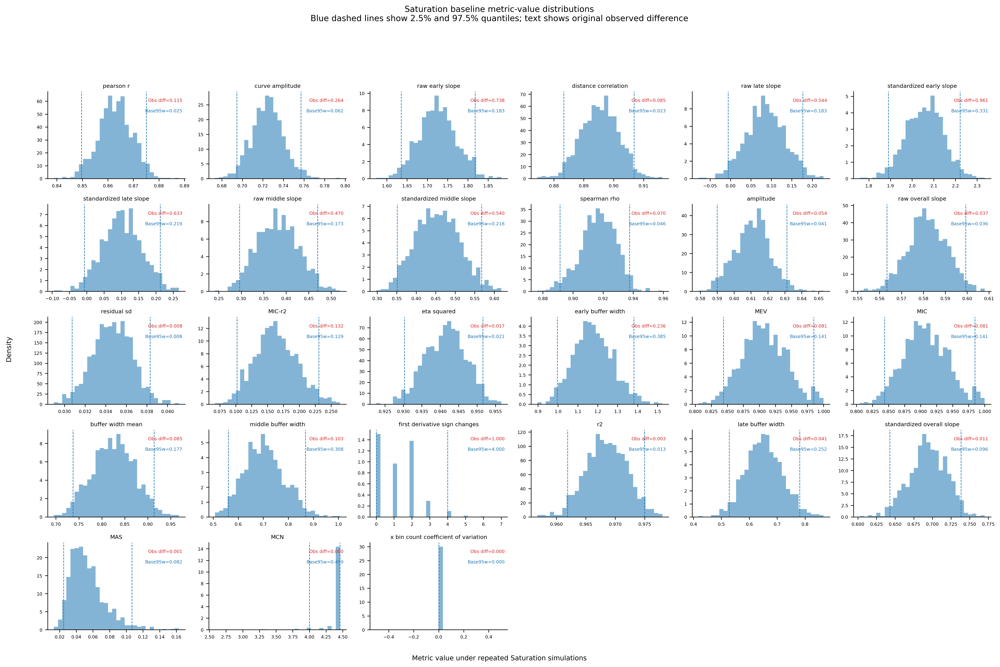

In [25]:
# ==========================================================
# Saturation baseline experiment
# Step 1: repeat Saturation only 1000 times
# Step 2: compare with original No saturation vs Saturation metric difference
# ==========================================================

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import math

from scipy.stats import pearsonr, spearmanr
from scipy.spatial.distance import pdist, squareform
from statsmodels.nonparametric.smoothers_lowess import lowess


# ==========================================================
# Optional: MIC / MAS / MEV / MCN
# ==========================================================

try:
    from minepy import MINE
    HAS_MINEPY = True
except Exception:
    HAS_MINEPY = False
    print("minepy is not installed. MIC/MAS/MEV/MCN will be skipped.")


# ==========================================================
# 1. Data generation
# Use your original Saturation / No saturation formulas
# ==========================================================

def generate_saturation_data_original_formula(
    seed,
    n=180,
    noise_sd=0.035,
    x_random=False,
):
    """
    Generate one saturation dataset using the original saturation formula.

    Saturation:
        y = 0.14 + 0.76 * (1 - exp(-4.5 * x))

    Random seed controls:
        1. x positions if x_random=True
        2. random noise around the saturation curve
    """

    rng = np.random.default_rng(seed)

    if x_random:
        x = np.sort(rng.uniform(0, 1, n))
    else:
        x = np.linspace(0, 1, n)

    y_base = 0.14 + 0.76 * (1 - np.exp(-4.5 * x))
    y = y_base + rng.normal(0, noise_sd, n)

    return x, y


def generate_original_no_saturation_and_saturation(
    n=180,
):
    """
    Generate the original deterministic No saturation and Saturation curves.
    This follows your original setting:

    if prop == "Saturation":
        return (
            (xx, 0.14 + 0.76 * xx),
            (xx, 0.14 + 0.76 * (1 - np.exp(-4.5 * xx))),
        )
    """

    xx = np.linspace(0, 1, n)

    x_no_sat = xx
    y_no_sat = 0.14 + 0.76 * xx

    x_sat = xx
    y_sat = 0.14 + 0.76 * (1 - np.exp(-4.5 * xx))

    return x_no_sat, y_no_sat, x_sat, y_sat


# ==========================================================
# 2. Metric helper functions
# ==========================================================

def safe_pearson(x, y):
    x = np.asarray(x, dtype=float)
    y = np.asarray(y, dtype=float)

    valid = np.isfinite(x) & np.isfinite(y)
    x = x[valid]
    y = y[valid]

    if len(x) < 3 or np.nanstd(x) == 0 or np.nanstd(y) == 0:
        return np.nan

    return pearsonr(x, y)[0]


def safe_spearman(x, y):
    x = np.asarray(x, dtype=float)
    y = np.asarray(y, dtype=float)

    valid = np.isfinite(x) & np.isfinite(y)
    x = x[valid]
    y = y[valid]

    if len(x) < 3 or np.nanstd(x) == 0 or np.nanstd(y) == 0:
        return np.nan

    return spearmanr(x, y)[0]


def distance_correlation(x, y):
    x = np.asarray(x, dtype=float).reshape(-1, 1)
    y = np.asarray(y, dtype=float).reshape(-1, 1)

    valid = np.isfinite(x[:, 0]) & np.isfinite(y[:, 0])
    x = x[valid]
    y = y[valid]

    if len(x) < 3:
        return np.nan

    a = squareform(pdist(x, metric="euclidean"))
    b = squareform(pdist(y, metric="euclidean"))

    A = a - a.mean(axis=0)[None, :] - a.mean(axis=1)[:, None] + a.mean()
    B = b - b.mean(axis=0)[None, :] - b.mean(axis=1)[:, None] + b.mean()

    dcov2_xy = np.mean(A * B)
    dcov2_xx = np.mean(A * A)
    dcov2_yy = np.mean(B * B)

    if dcov2_xx <= 0 or dcov2_yy <= 0:
        return np.nan

    return np.sqrt(dcov2_xy / np.sqrt(dcov2_xx * dcov2_yy))


def compute_mine_metrics(x, y):
    empty = {
        "MIC": np.nan,
        "MAS": np.nan,
        "MEV": np.nan,
        "MCN": np.nan,
        "MIC-r2": np.nan,
    }

    if not HAS_MINEPY:
        return empty

    x = np.asarray(x, dtype=float)
    y = np.asarray(y, dtype=float)

    valid = np.isfinite(x) & np.isfinite(y)
    x = x[valid]
    y = y[valid]

    if len(x) < 5:
        return empty

    mine = MINE(alpha=0.6, c=15)
    mine.compute_score(x, y)

    mic = mine.mic()
    mas = mine.mas()
    mev = mine.mev()
    mcn = mine.mcn()

    r = safe_pearson(x, y)
    r2 = r ** 2 if np.isfinite(r) else np.nan

    return {
        "MIC": mic,
        "MAS": mas,
        "MEV": mev,
        "MCN": mcn,
        "MIC-r2": mic - r2 if np.isfinite(r2) else np.nan,
    }


def minmax01(v):
    v = np.asarray(v, dtype=float)

    v_min = np.nanmin(v)
    v_max = np.nanmax(v)

    if not np.isfinite(v_min) or not np.isfinite(v_max):
        return np.full_like(v, np.nan)

    if v_max == v_min:
        return np.full_like(v, np.nan)

    return (v - v_min) / (v_max - v_min)


def segment_slope_fit(x_seg, y_seg):
    x_seg = np.asarray(x_seg, dtype=float)
    y_seg = np.asarray(y_seg, dtype=float)

    valid = np.isfinite(x_seg) & np.isfinite(y_seg)
    x_seg = x_seg[valid]
    y_seg = y_seg[valid]

    if len(x_seg) < 3 or np.nanstd(x_seg) == 0:
        return np.nan

    return np.polyfit(x_seg, y_seg, 1)[0]


def compute_segment_slopes(x, y, standardized=False):
    x = np.asarray(x, dtype=float)
    y = np.asarray(y, dtype=float)

    valid = np.isfinite(x) & np.isfinite(y)
    x = x[valid]
    y = y[valid]

    if len(x) < 6:
        return np.nan, np.nan, np.nan, np.nan

    order = np.argsort(x)
    x = x[order]
    y = y[order]

    if standardized:
        x = minmax01(x)
        y = minmax01(y)

    n = len(x)
    i1 = n // 3
    i2 = 2 * n // 3

    overall = segment_slope_fit(x, y)
    early = segment_slope_fit(x[:i1], y[:i1])
    middle = segment_slope_fit(x[i1:i2], y[i1:i2])
    late = segment_slope_fit(x[i2:], y[i2:])

    return overall, early, middle, late


def compute_x_bin_count_cv(x, n_bins=10):
    x = np.asarray(x, dtype=float)
    x = x[np.isfinite(x)]

    if len(x) == 0:
        return np.nan

    bins = pd.cut(
        x,
        bins=n_bins,
        labels=False,
        include_lowest=True,
        duplicates="drop",
    )

    counts = pd.Series(bins).value_counts().sort_index()
    counts = counts.reindex(np.arange(n_bins), fill_value=0)

    mean_count = counts.mean()
    sd_count = counts.std(ddof=1)

    if mean_count == 0:
        return np.nan

    return sd_count / mean_count


def compute_bin_metrics(x, y, n_bins=10, min_count_per_bin=3):
    x = np.asarray(x, dtype=float)
    y = np.asarray(y, dtype=float)

    valid = np.isfinite(x) & np.isfinite(y)
    x = x[valid]
    y = y[valid]

    empty_result = {
        "amplitude": np.nan,
        "eta squared": np.nan,
        "buffer width mean": np.nan,
        "early buffer width": np.nan,
        "middle buffer width": np.nan,
        "late buffer width": np.nan,
    }

    if len(x) < n_bins:
        return empty_result

    y_sd = np.nanstd(y, ddof=1)

    bins = pd.cut(
        x,
        bins=n_bins,
        labels=False,
        include_lowest=True,
        duplicates="drop",
    )

    df = pd.DataFrame({
        "x": x,
        "y": y,
        "bin": bins,
    }).dropna()

    if df.empty:
        return empty_result

    bin_stats = []

    for bin_id, g in df.groupby("bin", observed=True):

        if len(g) < min_count_per_bin:
            continue

        y_min = g["y"].min()
        y_max = g["y"].max()

        bin_stats.append({
            "bin": bin_id,
            "x_mean": g["x"].mean(),
            "y_mean": g["y"].mean(),
            "y_min": y_min,
            "y_max": y_max,
            "buffer_width": y_max - y_min,
            "count": len(g),
        })

    if len(bin_stats) < 3:
        return empty_result

    bin_df = (
        pd.DataFrame(bin_stats)
        .sort_values("x_mean")
        .reset_index(drop=True)
    )

    amplitude = bin_df["y_mean"].max() - bin_df["y_mean"].min()

    if y_sd == 0 or not np.isfinite(y_sd):
        bin_df["buffer_width_scaled"] = np.nan
    else:
        bin_df["buffer_width_scaled"] = bin_df["buffer_width"] / y_sd

    y_global_mean = df["y"].mean()
    ss_total = np.sum((df["y"] - y_global_mean) ** 2)

    ss_between = 0.0

    for _, g in df.groupby("bin", observed=True):
        if len(g) < min_count_per_bin:
            continue

        y_bin_mean = g["y"].mean()
        ss_between += len(g) * (y_bin_mean - y_global_mean) ** 2

    eta_squared = ss_between / ss_total if ss_total > 0 else np.nan

    n_valid_bins = len(bin_df)
    i1 = n_valid_bins // 3
    i2 = 2 * n_valid_bins // 3

    buffer_mean = bin_df["buffer_width_scaled"].mean()
    buffer_early = bin_df.iloc[:i1]["buffer_width_scaled"].mean()
    buffer_middle = bin_df.iloc[i1:i2]["buffer_width_scaled"].mean()
    buffer_late = bin_df.iloc[i2:]["buffer_width_scaled"].mean()

    return {
        "amplitude": amplitude,
        "eta squared": eta_squared,
        "buffer width mean": buffer_mean,
        "early buffer width": buffer_early,
        "middle buffer width": buffer_middle,
        "late buffer width": buffer_late,
    }


def compute_lowess_metrics(x, y, frac=0.25):
    x = np.asarray(x, dtype=float)
    y = np.asarray(y, dtype=float)

    valid = np.isfinite(x) & np.isfinite(y)
    x = x[valid]
    y = y[valid]

    empty_result = {
        "residual sd": np.nan,
        "curve amplitude": np.nan,
        "r2": np.nan,
        "first derivative sign changes": np.nan,
    }

    if len(x) < 10:
        return empty_result

    order = np.argsort(x)
    x_sorted = x[order]
    y_sorted = y[order]

    fitted = lowess(
        endog=y_sorted,
        exog=x_sorted,
        frac=frac,
        return_sorted=True,
    )

    x_fit = fitted[:, 0]
    y_fit = fitted[:, 1]

    y_pred = np.interp(x_sorted, x_fit, y_fit)

    residual = y_sorted - y_pred
    residual_sd = np.nanstd(residual, ddof=1)

    curve_amplitude = np.nanmax(y_fit) - np.nanmin(y_fit)

    ss_res = np.sum((y_sorted - y_pred) ** 2)
    ss_tot = np.sum((y_sorted - np.nanmean(y_sorted)) ** 2)

    r2 = 1 - ss_res / ss_tot if ss_tot > 0 else np.nan

    dx = np.gradient(x_fit)
    dy = np.gradient(y_fit)

    with np.errstate(divide="ignore", invalid="ignore"):
        derivative = dy / dx

    sign = np.sign(derivative)
    sign[sign == 0] = np.nan

    valid_sign = np.isfinite(sign)

    if valid_sign.sum() < 2:
        sign_changes = np.nan
    else:
        sign_valid = sign[valid_sign]
        sign_changes = np.sum(sign_valid[1:] != sign_valid[:-1])

    return {
        "residual sd": residual_sd,
        "curve amplitude": curve_amplitude,
        "r2": r2,
        "first derivative sign changes": sign_changes,
    }


# ==========================================================
# 3. Compute all metrics
# ==========================================================

def compute_all_metrics(x, y):
    metrics = {}

    metrics["pearson r"] = safe_pearson(x, y)
    metrics["spearman rho"] = safe_spearman(x, y)
    metrics["distance correlation"] = distance_correlation(x, y)

    (
        metrics["raw overall slope"],
        metrics["raw early slope"],
        metrics["raw middle slope"],
        metrics["raw late slope"],
    ) = compute_segment_slopes(x, y, standardized=False)

    (
        metrics["standardized overall slope"],
        metrics["standardized early slope"],
        metrics["standardized middle slope"],
        metrics["standardized late slope"],
    ) = compute_segment_slopes(x, y, standardized=True)

    metrics.update(compute_mine_metrics(x, y))

    metrics.update(compute_bin_metrics(x, y))

    metrics["x bin count coefficient of variation"] = compute_x_bin_count_cv(x)

    metrics.update(compute_lowess_metrics(x, y))

    return metrics


# ==========================================================
# 4. Original No saturation vs Saturation results
# Use the table you provided
# ==========================================================

original_metric_values = {
    "pearson r": {
        "No saturation": 0.9857,
        "Saturation": 0.8709,
    },
    "spearman rho": {
        "No saturation": 0.9866,
        "Saturation": 0.9170,
    },
    "distance correlation": {
        "No saturation": 0.9842,
        "Saturation": 0.8992,
    },
    "raw overall slope": {
        "No saturation": 0.7067,
        "Saturation": 0.6693,
    },
    "raw early slope": {
        "No saturation": 0.5978,
        "Saturation": 1.3354,
    },
    "raw middle slope": {
        "No saturation": 0.5066,
        "Saturation": 0.0368,
    },
    "raw late slope": {
        "No saturation": 0.4970,
        "Saturation": -0.0470,
    },
    "standardized overall slope": {
        "No saturation": 0.8169,
        "Saturation": 0.8280,
    },
    "standardized early slope": {
        "No saturation": 0.6910,
        "Saturation": 1.6519,
    },
    "standardized middle slope": {
        "No saturation": 0.5856,
        "Saturation": 0.0455,
    },
    "standardized late slope": {
        "No saturation": 0.5745,
        "Saturation": -0.0582,
    },
    "MIC": {
        "No saturation": 0.9838,
        "Saturation": 0.9027,
    },
    "MAS": {
        "No saturation": 0.0286,
        "Saturation": 0.0294,
    },
    "MEV": {
        "No saturation": 0.9838,
        "Saturation": 0.9027,
    },
    "MCN": {
        "No saturation": 4.3219,
        "Saturation": 4.3219,
    },
    "MIC-r2": {
        "No saturation": 0.0123,
        "Saturation": 0.1443,
    },
    "amplitude": {
        "No saturation": 3.0171,
        "Saturation": 3.0716,
    },
    "eta squared": {
        "No saturation": 0.9604,
        "Saturation": 0.9430,
    },
    "buffer width mean": {
        "No saturation": 0.5739,
        "Saturation": 0.6589,
    },
    "early buffer width": {
        "No saturation": 0.6527,
        "Saturation": 0.8887,
    },
    "middle buffer width": {
        "No saturation": 0.4971,
        "Saturation": 0.5997,
    },
    "late buffer width": {
        "No saturation": 0.5723,
        "Saturation": 0.5309,
    },
    "x bin count coefficient of variation": {
        "No saturation": 0.0000,
        "Saturation": 0.0000,
    },
    "residual sd": {
        "No saturation": 0.1667,
        "Saturation": 0.1745,
    },
    "curve amplitude": {
        "No saturation": 3.3301,
        "Saturation": 3.5946,
    },
    "r2": {
        "No saturation": 0.9722,
        "Saturation": 0.9695,
    },
    "first derivative sign changes": {
        "No saturation": 0.0000,
        "Saturation": 1.0000,
    },
}


original_observed_records = []

for metric, values in original_metric_values.items():
    no_sat_value = values["No saturation"]
    sat_value = values["Saturation"]

    original_observed_records.append({
        "metric": metric,
        "no_saturation_value": no_sat_value,
        "saturation_value": sat_value,
        "observed_difference": abs(sat_value - no_sat_value),
    })

original_observed_df = pd.DataFrame(original_observed_records)


# ==========================================================
# 5. Step 1: Repeat Saturation only
# ==========================================================

n_runs = 1000
noise_sd = 0.035
x_random = False

baseline_records = []

for seed in range(n_runs):

    x_sat, y_sat = generate_saturation_data_original_formula(
        seed=seed,
        n=180,
        noise_sd=noise_sd,
        x_random=x_random,
    )

    metrics = compute_all_metrics(x_sat, y_sat)
    metrics["seed"] = seed

    baseline_records.append(metrics)

baseline_saturation_df = pd.DataFrame(baseline_records)


# ==========================================================
# 6. Baseline summary
# ==========================================================

baseline_summary_records = []

metric_names = [
    c for c in baseline_saturation_df.columns
    if c != "seed"
]

for metric in metric_names:

    values = (
        baseline_saturation_df[metric]
        .replace([np.inf, -np.inf], np.nan)
        .dropna()
    )

    if len(values) == 0:
        continue

    q025 = values.quantile(0.025)
    q975 = values.quantile(0.975)

    baseline_summary_records.append({
        "metric": metric,
        "baseline_mean": values.mean(),
        "baseline_sd": values.std(ddof=1),
        "baseline_min": values.min(),
        "baseline_max": values.max(),
        "baseline_range": values.max() - values.min(),
        "baseline_q025": q025,
        "baseline_q975": q975,
        "baseline_95_width": q975 - q025,
    })

baseline_summary_df = pd.DataFrame(baseline_summary_records)


# ==========================================================
# 7. Compare original observed difference with saturation baseline
# ==========================================================

comparison_df = original_observed_df.merge(
    baseline_summary_df,
    on="metric",
    how="left",
)

comparison_df["ratio_to_baseline_95_width"] = (
    comparison_df["observed_difference"]
    / comparison_df["baseline_95_width"]
)

comparison_df["ratio_to_baseline_sd"] = (
    comparison_df["observed_difference"]
    / comparison_df["baseline_sd"]
)

comparison_df["larger_than_baseline_95_width"] = (
    comparison_df["observed_difference"]
    > comparison_df["baseline_95_width"]
)

comparison_df["larger_than_baseline_range"] = (
    comparison_df["observed_difference"]
    > comparison_df["baseline_range"]
)

comparison_df = comparison_df.sort_values(
    "ratio_to_baseline_95_width",
    ascending=False,
).reset_index(drop=True)

display(comparison_df)


# ==========================================================
# 8. Plot: observed difference vs saturation baseline variability
# ==========================================================

plot_df = comparison_df.copy()
plot_df = plot_df.replace([np.inf, -np.inf], np.nan)
plot_df = plot_df.dropna(subset=["ratio_to_baseline_95_width"])

plot_df = plot_df.sort_values(
    "ratio_to_baseline_95_width",
    ascending=True,
)

fig, ax = plt.subplots(
    figsize=(8.5, max(6, 0.32 * len(plot_df))),
    dpi=300,
)

y_pos = np.arange(len(plot_df))

ax.barh(
    y_pos,
    plot_df["ratio_to_baseline_95_width"],
    alpha=0.85,
)

ax.axvline(
    1,
    linestyle="--",
    linewidth=1.2,
    alpha=0.85,
)

ax.text(
    1.02,
    len(plot_df) - 0.5,
    "observed difference = baseline 95% width",
    fontsize=8,
    va="top",
)

ax.set_yticks(y_pos)
ax.set_yticklabels(
    plot_df["metric"],
    fontsize=7,
)

ax.set_xlabel(
    "Observed No saturation–Saturation difference / Saturation baseline 95% width",
    fontsize=9,
)

ax.set_title(
    "Does the original Saturation–No saturation difference exceed Saturation baseline variability?",
    fontsize=11,
    pad=10,
)

ax.tick_params(axis="x", labelsize=8)

for spine in ["top", "right"]:
    ax.spines[spine].set_visible(False)

plt.tight_layout()
plt.show()


# ==========================================================
# 9. Plot: baseline distributions with observed difference markers
# ==========================================================

n_cols = 6
top_k = None

plot_metrics = comparison_df["metric"].tolist()

if top_k is not None:
    plot_metrics = plot_metrics[:top_k]

n_metrics = len(plot_metrics)
n_rows = math.ceil(n_metrics / n_cols)

fig, axes = plt.subplots(
    n_rows,
    n_cols,
    figsize=(3.1 * n_cols, 2.35 * n_rows),
    dpi=300,
)

axes = np.asarray(axes).reshape(-1)

baseline_color = "tab:blue"
observed_color = "tab:red"

for ax_idx, metric in enumerate(plot_metrics):

    ax = axes[ax_idx]

    baseline_values = (
        baseline_saturation_df[metric]
        .replace([np.inf, -np.inf], np.nan)
        .dropna()
        .values
    )

    observed_diff = comparison_df.loc[
        comparison_df["metric"] == metric,
        "observed_difference"
    ].values[0]

    baseline_width = comparison_df.loc[
        comparison_df["metric"] == metric,
        "baseline_95_width"
    ].values[0]

    if len(baseline_values) < 5:
        ax.set_title(f"{metric}\nno valid values", fontsize=7)
        ax.axis("off")
        continue

    ax.hist(
        baseline_values,
        bins=30,
        alpha=0.55,
        color=baseline_color,
        density=True,
        label="Saturation baseline metric values" if ax_idx == 0 else None,
    )

    q025 = np.nanquantile(baseline_values, 0.025)
    q975 = np.nanquantile(baseline_values, 0.975)

    ax.axvline(
        q025,
        color=baseline_color,
        linestyle="--",
        linewidth=0.8,
    )

    ax.axvline(
        q975,
        color=baseline_color,
        linestyle="--",
        linewidth=0.8,
    )

    ax.text(
        0.98,
        0.92,
        f"Obs diff={observed_diff:.3f}",
        transform=ax.transAxes,
        ha="right",
        va="top",
        fontsize=6,
        color=observed_color,
    )

    ax.text(
        0.98,
        0.80,
        f"Base95w={baseline_width:.3f}",
        transform=ax.transAxes,
        ha="right",
        va="top",
        fontsize=6,
        color=baseline_color,
    )

    ax.set_title(
        metric,
        fontsize=7.5,
        pad=5,
    )

    ax.tick_params(axis="both", labelsize=6)

    for spine in ["top", "right"]:
        ax.spines[spine].set_visible(False)

for j in range(n_metrics, len(axes)):
    axes[j].axis("off")

fig.suptitle(
    "Saturation baseline metric-value distributions\n"
    "Blue dashed lines show 2.5% and 97.5% quantiles; text shows original observed difference",
    fontsize=11,
    y=1.04,
)

fig.text(
    0.5,
    0.01,
    "Metric value under repeated Saturation simulations",
    ha="center",
    fontsize=9,
)

fig.text(
    0.01,
    0.5,
    "Density",
    va="center",
    rotation="vertical",
    fontsize=9,
)

plt.tight_layout(rect=[0.03, 0.03, 1, 0.97])
plt.show()

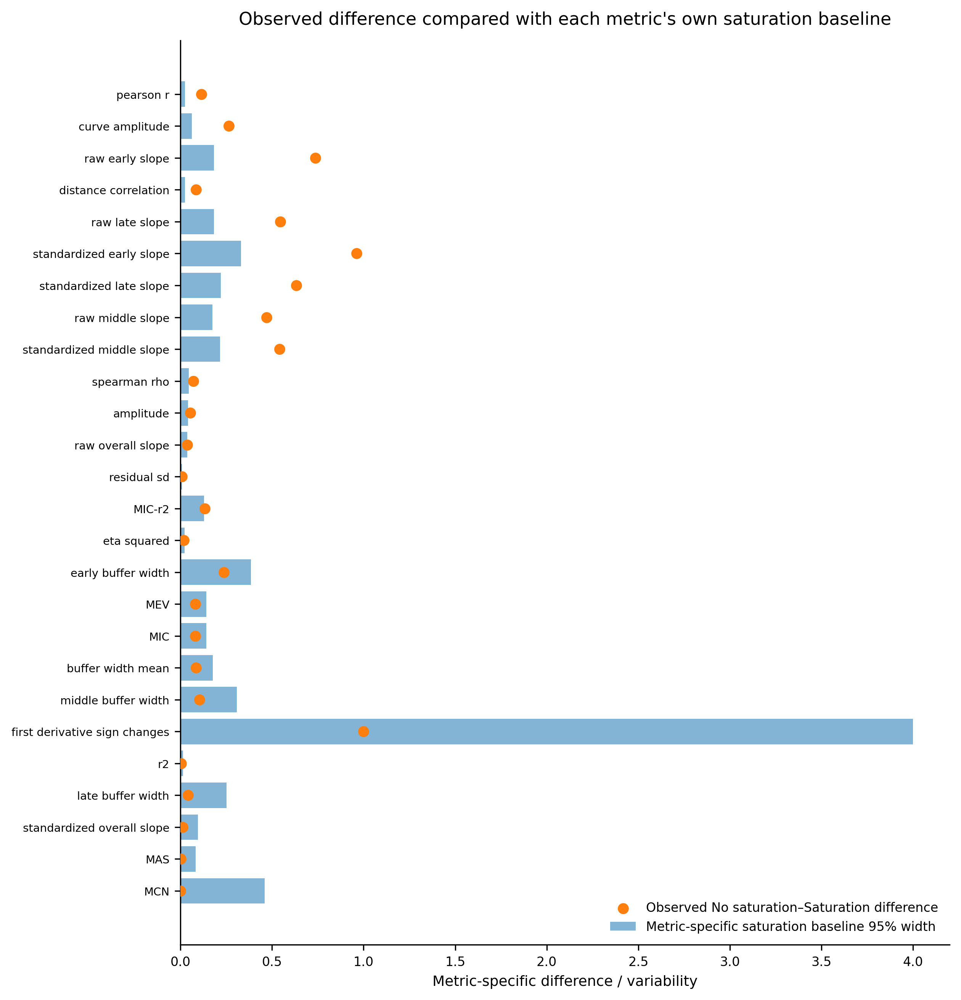

In [26]:
# ==========================================================
# Plot: each metric has its own baseline
# Blue bar = baseline 95% width for this metric
# Red point = observed No saturation–Saturation difference
# ==========================================================

plot_df = comparison_df.copy()

plot_df = plot_df.replace([np.inf, -np.inf], np.nan)
plot_df = plot_df.dropna(
    subset=[
        "baseline_95_width",
        "observed_difference",
        "ratio_to_baseline_95_width",
    ]
)

plot_df = plot_df.sort_values(
    "ratio_to_baseline_95_width",
    ascending=True
)

fig, ax = plt.subplots(
    figsize=(8.5, max(6, 0.34 * len(plot_df))),
    dpi=300,
)

y_pos = np.arange(len(plot_df))

# Each metric's own baseline width
ax.barh(
    y_pos,
    plot_df["baseline_95_width"],
    alpha=0.55,
    label="Metric-specific saturation baseline 95% width",
)

# Each metric's observed difference
ax.scatter(
    plot_df["observed_difference"],
    y_pos,
    s=35,
    zorder=3,
    label="Observed No saturation–Saturation difference",
)

ax.set_yticks(y_pos)
ax.set_yticklabels(
    plot_df["metric"],
    fontsize=7,
)

ax.set_xlabel(
    "Metric-specific difference / variability",
    fontsize=9,
)

ax.set_title(
    "Observed difference compared with each metric's own saturation baseline",
    fontsize=11,
    pad=10,
)

ax.legend(
    frameon=False,
    fontsize=8,
    loc="lower right",
)

ax.tick_params(axis="x", labelsize=8)

for spine in ["top", "right"]:
    ax.spines[spine].set_visible(False)

plt.tight_layout()
plt.show()

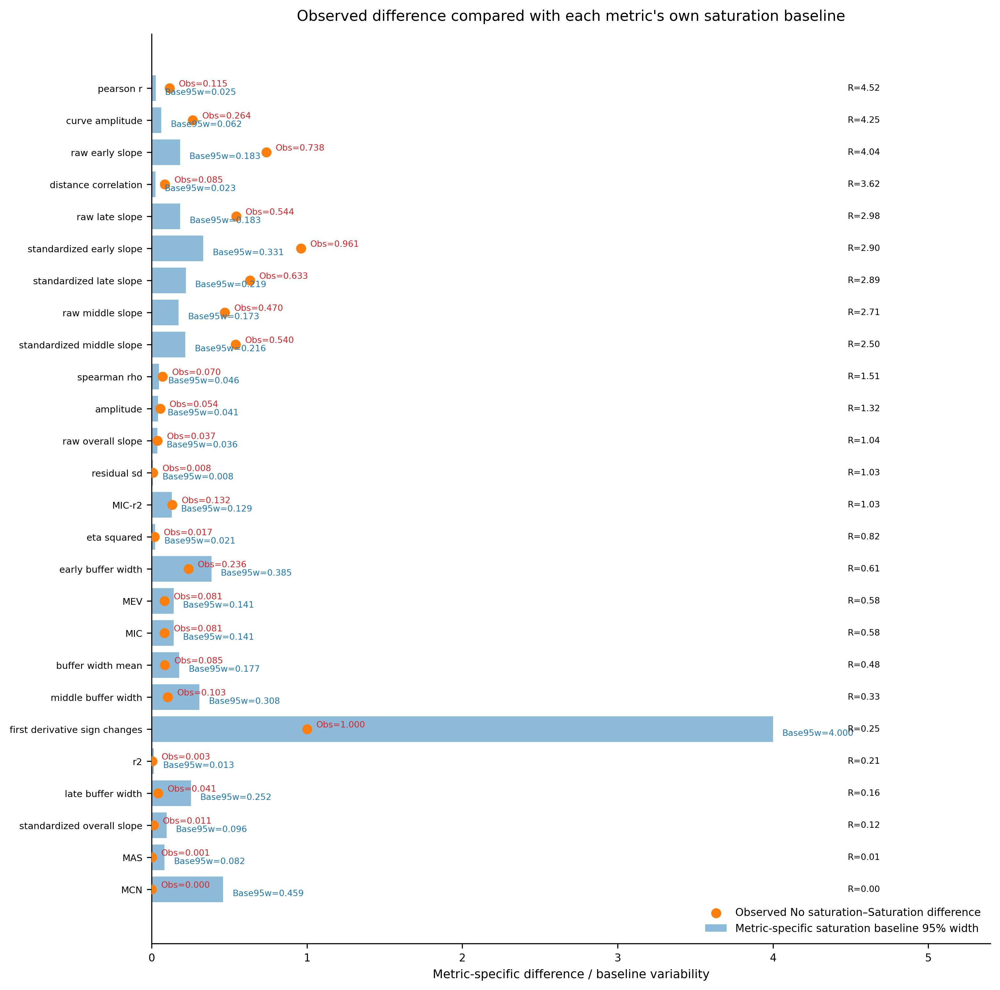

In [27]:
# ==========================================================
# Plot: each metric has its own baseline
# Blue bar = metric-specific saturation baseline 95% width
# Red point = observed No saturation–Saturation difference
# Values are annotated
# ==========================================================

plot_df = comparison_df.copy()

plot_df = plot_df.replace([np.inf, -np.inf], np.nan)
plot_df = plot_df.dropna(
    subset=[
        "baseline_95_width",
        "observed_difference",
        "ratio_to_baseline_95_width",
    ]
)

# Sort by ratio
plot_df = plot_df.sort_values(
    "ratio_to_baseline_95_width",
    ascending=True
).reset_index(drop=True)

fig, ax = plt.subplots(
    figsize=(10.5, max(6, 0.40 * len(plot_df))),
    dpi=300,
)

y_pos = np.arange(len(plot_df))

# ----------------------------------------------------------
# 1. Baseline 95% width bar
# ----------------------------------------------------------
ax.barh(
    y_pos,
    plot_df["baseline_95_width"],
    alpha=0.50,
    label="Metric-specific saturation baseline 95% width",
)

# ----------------------------------------------------------
# 2. Observed difference point
# ----------------------------------------------------------
ax.scatter(
    plot_df["observed_difference"],
    y_pos,
    s=42,
    zorder=3,
    label="Observed No saturation–Saturation difference",
)

# ----------------------------------------------------------
# 3. Add value labels
# ----------------------------------------------------------

x_max = max(
    plot_df["baseline_95_width"].max(),
    plot_df["observed_difference"].max()
)

x_offset = 0.015 * x_max

for i, row in plot_df.iterrows():

    baseline_width = row["baseline_95_width"]
    observed_diff = row["observed_difference"]
    ratio = row["ratio_to_baseline_95_width"]

    # Label for baseline width
    ax.text(
        baseline_width + x_offset,
        i - 0.13,
        f"Base95w={baseline_width:.3f}",
        va="center",
        ha="left",
        fontsize=6.5,
        color="tab:blue",
    )

    # Label for observed difference
    ax.text(
        observed_diff + x_offset,
        i + 0.13,
        f"Obs={observed_diff:.3f}",
        va="center",
        ha="left",
        fontsize=6.5,
        color="tab:red",
    )

    # Optional ratio label on the far right
    ax.text(
        x_max * 1.12,
        i,
        f"R={ratio:.2f}",
        va="center",
        ha="left",
        fontsize=6.5,
        color="black",
    )

# ----------------------------------------------------------
# 4. Axis settings
# ----------------------------------------------------------

ax.set_yticks(y_pos)
ax.set_yticklabels(
    plot_df["metric"],
    fontsize=7,
)

ax.set_xlabel(
    "Metric-specific difference / baseline variability",
    fontsize=9,
)

ax.set_title(
    "Observed difference compared with each metric's own saturation baseline",
    fontsize=11,
    pad=10,
)

ax.legend(
    frameon=False,
    fontsize=8,
    loc="lower right",
)

ax.tick_params(axis="x", labelsize=8)

# Extend x-axis to leave space for labels
ax.set_xlim(0, x_max * 1.35)

for spine in ["top", "right"]:
    ax.spines[spine].set_visible(False)

plt.tight_layout()
plt.show()

In [36]:
# ==========================================================
# Saturation test with empirical p-values
# Baseline distribution: Saturation vs Saturation, 1000 runs
# Observed difference: Saturation vs No saturation, one paired comparison
# ==========================================================

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt


# ==========================================================
# 1. Experiment settings
# ==========================================================

n_runs = 1000
noise_sd = 0.035
x_random = True

observed_seed = 2026


# ==========================================================
# 2. Baseline distribution
#    Saturation vs Saturation
# ==========================================================

baseline_diff_records = []

for seed in range(n_runs):

    x_sat_a, y_sat_a = generate_saturation_data(
        seed=seed,
        saturation=True,
        noise_sd=noise_sd,
        x_random=x_random,
    )

    x_sat_b, y_sat_b = generate_saturation_data(
        seed=seed + 10000,
        saturation=True,
        noise_sd=noise_sd,
        x_random=x_random,
    )

    metrics_a = compute_all_metrics(x_sat_a, y_sat_a)
    metrics_b = compute_all_metrics(x_sat_b, y_sat_b)

    record = {"seed": seed}

    for metric_name in metrics_a.keys():
        value_a = metrics_a.get(metric_name, np.nan)
        value_b = metrics_b.get(metric_name, np.nan)

        record[metric_name] = abs(value_a - value_b)

    baseline_diff_records.append(record)


baseline_diff_df = pd.DataFrame(baseline_diff_records)


# ==========================================================
# 3. Observed difference
#    Saturation vs No saturation
# ==========================================================

x_sat_obs, y_sat_obs = generate_saturation_data(
    seed=observed_seed,
    saturation=True,
    noise_sd=noise_sd,
    x_random=x_random,
)

x_nosat_obs, y_nosat_obs = generate_saturation_data(
    seed=observed_seed,
    saturation=False,
    noise_sd=noise_sd,
    x_random=x_random,
)

sat_obs_metrics = compute_all_metrics(x_sat_obs, y_sat_obs)
nosat_obs_metrics = compute_all_metrics(x_nosat_obs, y_nosat_obs)

observed_diff = {}

for metric_name in sat_obs_metrics.keys():
    sat_value = sat_obs_metrics.get(metric_name, np.nan)
    nosat_value = nosat_obs_metrics.get(metric_name, np.nan)

    observed_diff[metric_name] = abs(sat_value - nosat_value)


observed_diff_df = pd.DataFrame([
    {
        "metric": metric_name,
        "saturation_value": sat_obs_metrics.get(metric_name, np.nan),
        "no_saturation_value": nosat_obs_metrics.get(metric_name, np.nan),
        "observed_abs_diff": diff_value,
    }
    for metric_name, diff_value in observed_diff.items()
])


# ==========================================================
# 4. Empirical p-value
# ==========================================================
# p = proportion of baseline differences >= observed difference
# If count = 0 among 1000 runs, report p < 0.001.
# ==========================================================

metric_names = [
    c for c in baseline_diff_df.columns
    if c != "seed"
]

pvalue_records = []

for metric_name in metric_names:

    baseline_values = (
        baseline_diff_df[metric_name]
        .replace([np.inf, -np.inf], np.nan)
        .dropna()
    )

    observed_value = observed_diff.get(metric_name, np.nan)

    if len(baseline_values) == 0 or not np.isfinite(observed_value):
        continue

    count_ge = np.sum(baseline_values >= observed_value)
    n_valid = len(baseline_values)

    empirical_p = count_ge / n_valid

    if count_ge == 0:
        p_label = f"< {1 / n_valid:.4f}"
    else:
        p_label = f"{empirical_p:.4f}"

    pvalue_records.append({
        "metric": metric_name,

        "observed_abs_diff": observed_value,

        "baseline_mean": baseline_values.mean(),
        "baseline_median": baseline_values.median(),
        "baseline_p95": baseline_values.quantile(0.95),
        "baseline_p975": baseline_values.quantile(0.975),
        "baseline_max": baseline_values.max(),

        "n_baseline": n_valid,
        "count_baseline_ge_observed": count_ge,
        "empirical_p": empirical_p,
        "p_label": p_label,

        "observed_exceeds_baseline_p95": observed_value > baseline_values.quantile(0.95),
        "observed_exceeds_baseline_max": observed_value > baseline_values.max(),
    })


pvalue_df = pd.DataFrame(pvalue_records)

pvalue_df = pvalue_df.sort_values(
    "empirical_p",
    ascending=True,
).reset_index(drop=True)

pvalue_df

,metric,observed_abs_diff,baseline_mean,baseline_median,baseline_p95,baseline_p975,baseline_max,n_baseline,count_baseline_ge_observed,empirical_p,p_label,observed_exceeds_baseline_p95,observed_exceeds_baseline_max
0,pearson r,0.139560,0.012377,0.010389,0.030255,0.033641,0.046637,1000,0,0.000,< 0.0010,True,True
1,distance correlation,0.098871,0.011944,0.009795,0.029302,0.034922,0.057235,1000,0,0.000,< 0.0010,True,True
2,raw overall slope,0.202952,0.035449,0.029914,0.090251,0.105810,0.168297,1000,0,0.000,< 0.0010,True,True
3,raw early slope,0.846599,0.149055,0.124551,0.380074,0.426833,0.671414,1000,0,0.000,< 0.0010,True,True
4,raw late slope,0.663963,0.053692,0.044980,0.134506,0.153697,0.235200,1000,0,0.000,< 0.0010,True,True
5,standardized overall slope,0.217297,0.046438,0.039539,0.115626,0.130560,0.193536,1000,0,0.000,< 0.0010,True,True
6,standardized early slope,1.009648,0.183601,0.154871,0.465569,0.553386,0.729147,1000,0,0.000,< 0.0010,True,True
7,standardized late slope,0.757796,0.063993,0.054326,0.159892,0.184362,0.280477,1000,0,0.000,< 0.0010,True,True
8,early buffer width,0.606187,0.144298,0.126571,0.346172,0.398988,0.604534,1000,0,0.000,< 0.0010,True,True
9,raw middle slope,0.367590,0.079559,0.067154,0.194428,0.216818,0.367995,1000,1,0.001,0.0010,True,False


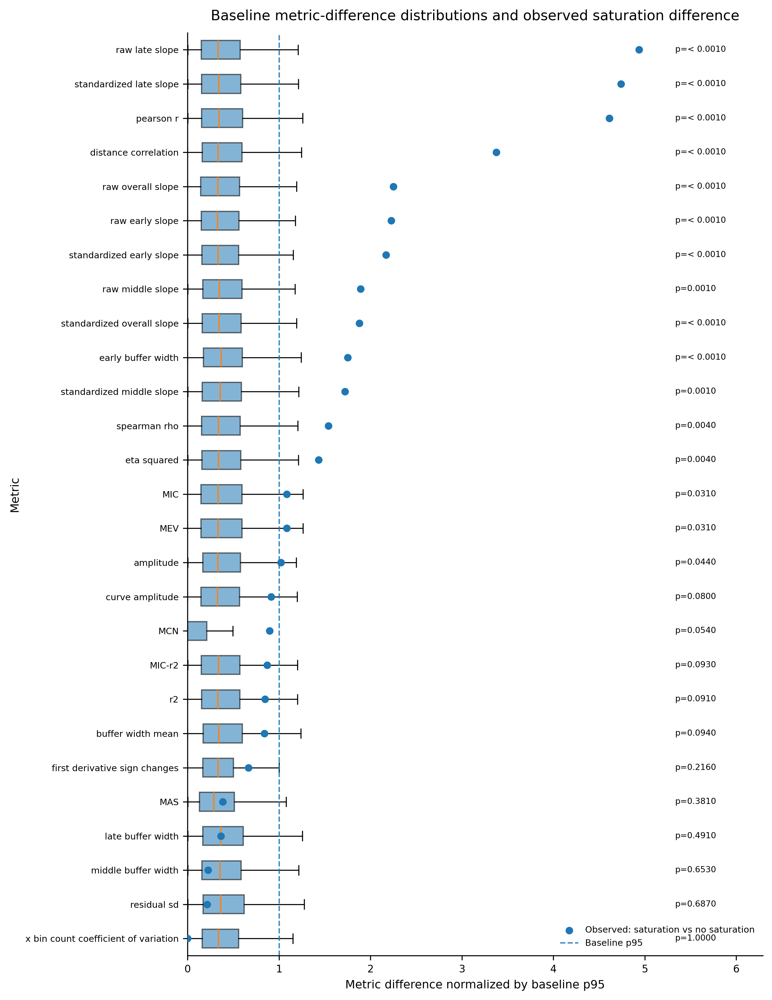

In [39]:
# ==========================================================
# 5. Plot baseline distribution + observed difference line
# ==========================================================

all_metrics_to_plot = [
    m for m in metric_names
    if m in baseline_diff_df.columns and m in observed_diff
]

metrics_per_page = 6

for page_start in range(0, len(all_metrics_to_plot), metrics_per_page):

    page_metrics = all_metrics_to_plot[
        page_start:page_start + metrics_per_page
    ]

    n_metrics_page = len(page_metrics)

    fig, axes = plt.subplots(
        n_metrics_page,
        1,
        figsize=(5.8, 1.75 * n_metrics_page),
        dpi=300,
    )

    if n_metrics_page == 1:
        axes = [axes]

    for ax, metric_name in zip(axes, page_metrics):

        baseline_values = (
            baseline_diff_df[metric_name]
            .replace([np.inf, -np.inf], np.nan)
            .dropna()
        )

        observed_value = observed_diff.get(metric_name, np.nan)

        row = pvalue_df.loc[
            pvalue_df["metric"] == metric_name
        ]

        if len(row) == 0:
            p_label = "NA"
        else:
            p_label = row.iloc[0]["p_label"]

        if len(baseline_values) == 0 or not np.isfinite(observed_value):
            ax.set_title(
                f"{metric_name} | no valid values",
                fontsize=8,
            )
            continue

        baseline_p95 = baseline_values.quantile(0.95)

        # Blue: baseline distribution
        ax.hist(
            baseline_values,
            bins=30,
            alpha=0.60,
            density=True,
            label="Baseline: saturation vs saturation",
        )

        # Dashed line: baseline p95
        ax.axvline(
            baseline_p95,
            linestyle="--",
            linewidth=1.1,
            alpha=0.85,
            label="Baseline p95",
        )

        # Orange line: observed difference
        ax.axvline(
            observed_value,
            linewidth=1.6,
            alpha=0.95,
            label="Observed: saturation vs no saturation",
        )

        ax.set_title(
            f"{metric_name} | observed={observed_value:.4f}, p={p_label}",
            fontsize=8,
            pad=5,
        )

        ax.set_ylabel("Density", fontsize=8)
        ax.tick_params(axis="both", labelsize=7)

        for spine in ["top", "right"]:
            ax.spines[spine].set_visible(False)

    axes[-1].set_xlabel(
        "Absolute metric difference",
        fontsize=8,
    )

    axes[0].legend(
        fontsize=7,
        frameon=False,
        loc="upper right",
    )

    fig.suptitle(
        f"Baseline distribution and observed difference "
        f"(metrics {page_start + 1}–{page_start + n_metrics_page})",
        fontsize=10,
        y=1.01,
    )

    plt.tight_layout()
    plt.show()

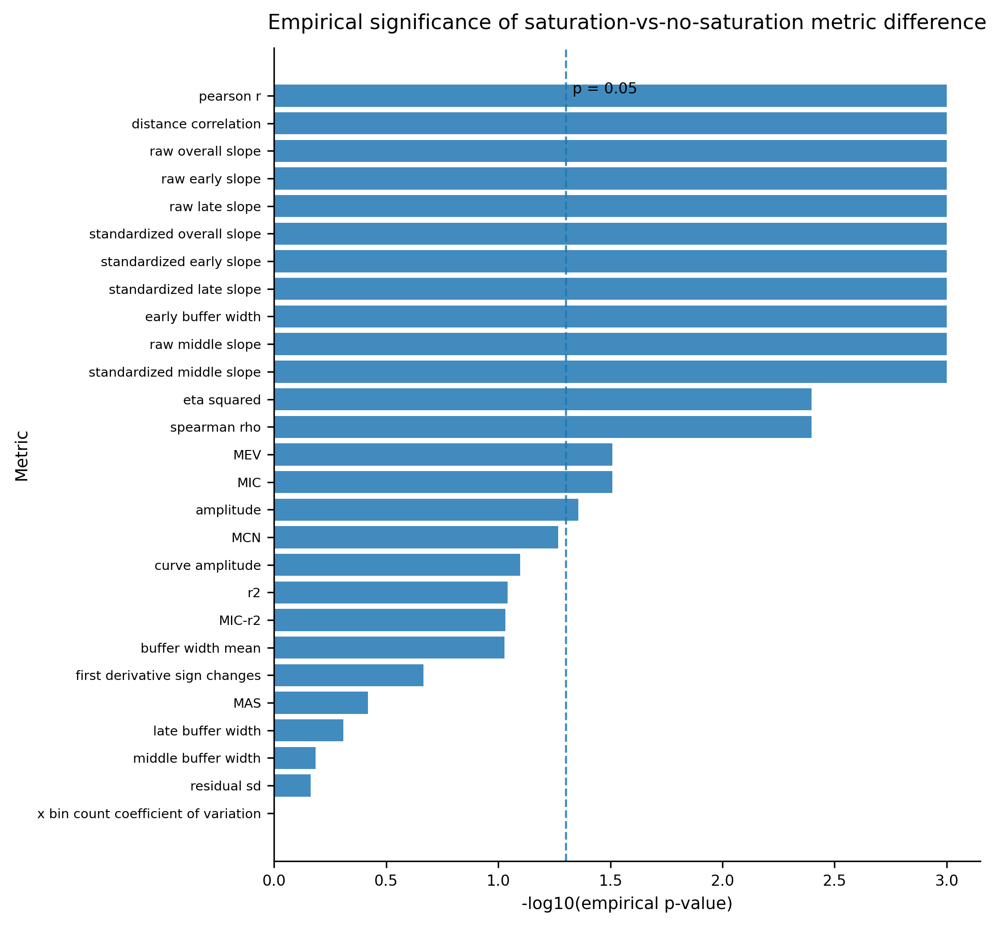

In [37]:
# ==========================================================
# 6. Overview plot: empirical p-values
# ==========================================================

plot_df = pvalue_df.copy()

# For zero p, use 1 / n as upper bound for plotting
plot_df["p_for_plot"] = plot_df.apply(
    lambda row: 1 / row["n_baseline"]
    if row["count_baseline_ge_observed"] == 0
    else row["empirical_p"],
    axis=1,
)

plot_df["minus_log10_p"] = -np.log10(plot_df["p_for_plot"])

plot_df = plot_df.sort_values(
    "minus_log10_p",
    ascending=True,
)

fig, ax = plt.subplots(
    figsize=(7.5, 7.0),
    dpi=300,
)

ax.barh(
    plot_df["metric"],
    plot_df["minus_log10_p"],
    alpha=0.85,
)

# p = 0.05 line
ax.axvline(
    -np.log10(0.05),
    linestyle="--",
    linewidth=1.1,
    alpha=0.85,
)

ax.text(
    -np.log10(0.05) + 0.03,
    len(plot_df) - 0.5,
    "p = 0.05",
    fontsize=8,
    va="top",
)

ax.set_xlabel(
    "-log10(empirical p-value)",
    fontsize=9,
)

ax.set_ylabel(
    "Metric",
    fontsize=9,
)

ax.set_title(
    "Empirical significance of saturation-vs-no-saturation metric difference",
    fontsize=11,
    pad=10,
)

ax.tick_params(axis="y", labelsize=7)
ax.tick_params(axis="x", labelsize=8)

for spine in ["top", "right"]:
    ax.spines[spine].set_visible(False)

plt.tight_layout()
plt.show()